<a href="https://colab.research.google.com/github/CalculatedContent/ww-colab/blob/master/ww_kdd2020_0_100_Update010520.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Setup**

In [0]:
import pandas as pd
import numpy as np
import time
import datetime as dt
import itertools
import os
import statsmodels.api as sm
import matplotlib.pyplot as plt
from google.colab import files #Google colab ONLY

In [0]:
istart = 0
iend = istart+100

In [3]:
## If export the output to Google Drive (colab ONLY) --> Optional
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [13]:
import sys
path = '/content/drive/My Drive/kdd2020_cv'
sys.path.append(path)

if not os.path.exists(path): #if the path does not already exists, create one
   !mkdir "$path"

!ls "$path"

df_all.xlsx


In [6]:
!pip install weightwatcher #install from source
#!pip install powerlaw #needed if install ww from local

  Created wheel for powerlaw: filename=powerlaw-1.4.6-cp36-none-any.whl size=24786 sha256=de035d059e4ee55395d77119d74d9a8627ceda19809fb82decf2aaaaa861e11f
  Stored in directory: /root/.cache/pip/wheels/e0/27/02/08d0e2865072bfd8d7c655e290521e3feca3fc22f1ac460601
Successfully built powerlaw


In [7]:
import weightwatcher as ww

# Suppress the powerlaw package warnings
# "powerlaw.py:700: RuntimeWarning: divide by zero encountered in true_divide"
# "powerlaw.py:700: RuntimeWarning: invalid value encountered in true_divide"
import warnings
warnings.simplefilter(action='ignore', category=RuntimeWarning)

# crea
import logging
logger = logging.getLogger("imported_module")
logger.setLevel(logging.CRITICAL)

Using TensorFlow backend.


# **PyTorchCV Models** 

## These cells need to be rerun multiple times to get all the data![alt text](https://)

### **1. Analyze all models in Pytorchcv**

In [14]:
!pip install pytorchcv

     |████████████████████████████████| 378kB 3.5MB/s 


In [0]:
## Check storage
#import subprocess
#p = subprocess.Popen('df -h', shell=True, stdout=subprocess.PIPE)
#print(str(p.communicate()[0], 'utf-8'))

In [15]:
from pytorchcv.model_provider import get_model as ptcv_get_model
import torch

import pytorchcv
import pytorchcv.models.model_store

modelnames = pytorchcv.models.model_store._model_sha1.keys()
modelnames = list(modelnames)
print('{} models to examine'.format(len(modelnames)))

466 models to examine


In [0]:
## If you have record models that could not be found
# this_models = pd.read_excel('notfound.xlsx')[0].tolist()
# len(this_models[1:])

# Reun upto and including this cell  until all data is available

In [0]:
## Set up the data to start storing
data = {} #Store main model data
notfound = []
ww_error = []

In [0]:
## Takes about 10-15 hours to run 400+ models as of 12/31/2019

ss = time.time()
i = 0
for modelname in modelnames[istart:iend]: 
    print(modelname)
    try:
        s = time.time()
        model = ptcv_get_model(modelname, pretrained=True)

    except:
        notfound.append(modelname)
        e = time.time()
        print("{} not found".format(modelname))
        print('--------------------------------------------------------')
        i += 1
        continue

    try:
        watcher = ww.WeightWatcher(model=model, logger=logger)
        results = watcher.analyze(alphas = True, spectralnorms=True, softranks=True, mp_fit = True, normalize = True)
        e = time.time()
        
        data[modelname]=watcher.get_summary()
        
        print('time spent is {}'.format((e-s)/60.))
        print('--------------------------------------------------------')
        
    except:
        ww_error.append(modelname)
        e = time.time()
        print("Error in weightwatcher operation for {}".format(modelname))
        print('--------------------------------------------------------')
        
    i += 1

    #Export/backup the results every 1 hour runtime or every 50 models  
    if ((e - ss) > 60*60) or ((i - istart)%25 == 0): 
      
        ddf = pd.DataFrame.from_dict(data).transpose()
        ddf.to_excel(path + '/data_{}-{}_{}.xlsx'.format(istart, i, dt.date.today()))
        
        ss = time.time()
        
        #try:
        #    !rm -rf /root/.torch/models #clean the memory
        #except:
        #    pass
          
    if i >= iend: #Export when all models are finished
      
        ddf = pd.DataFrame.from_dict(data).transpose()
        ddf.to_excel(path + '/data_{}-{}_{}.xlsx'.format(istart, i, dt.date.today()))
        
        # break

ddf = pd.DataFrame.from_dict(data).transpose()
ddf.to_excel(path + '/data_{}-{}_{}.xlsx'.format(istart, i, dt.date.today()))

# Stop Here until all data is available

In [0]:
## Export the whole dataset mannually
# ddf = pd.DataFrame.from_dict(data).transpose()
# ddf.to_excel(path + '/df_all.xlsx')
#files.download(path + '/df_all.xlsx')
# ddf.to_excel(path + '/data_{}-{}_{}.xlsx'.format(start, i, dt.date.today()))

In [0]:
if notfound != []:
    pd.DataFrame(notfound).to_excel(path + '/notfound_{}.xlsx'.format(dt.date.today()))

if ww_error != []:
    pd.DataFrame(notfound).to_excel(path + '/ww_error_{}.xlsx'.format(dt.date.today()))

# Read in all pre-computed Data

In [19]:
try:
    ## Load the model results data
    # df_all = pd.read_excel('/content/drive/My Drive/df_all.xlsx')\
    #       .rename(columns = {'Unnamed: 0': 'index'}).set_index('index')
    df_all = pd.read_excel(path + '/df_all.xlsx', index_col = 0)
    print(df_all)
except:
    ## If the above cell runs different batches of the data
    ## Use this cell to concat the data together
    print('Concating files...')
    df_all = pd.DataFrame()
    for f in os.listdir(path):
        if f.startswith('data_'): #detect data
            tempp = pd.read_excel(path + '/' + f)\
                        .rename(columns = {'Unnamed: 0':'modelname'})
            df_all = pd.concat([df_all, tempp], axis = 0, sort = False)
            print(f)
            print(df_all.tail(1))

    del tempp

    df_all = df_all.drop_duplicates().reset_index(drop = True)

#rint(len(df_all))
#df_all.dropna(inplace=True)
#print(len(df_all))

                     modelname     alpha  ...  spectralnorm_compound  index
0                      alexnet  2.653116  ...              20.102526      1
1                        zfnet  2.756450  ...              19.520657      3
2                       zfnetb  2.655885  ...              20.455984      4
3                        vgg11  2.718865  ...              22.276894      5
4                        vgg13  2.672990  ...              19.301830      6
..                         ...       ...  ...                    ...    ...
439   fcn8sd_resnetd50b_ade20k  3.203384  ...               1.936216    442
440  fcn8sd_resnetd101b_ade20k  3.029270  ...               0.918805    443
441    fcn8sd_resnetd101b_coco  2.878287  ...               0.512868    444
442               mobilenet_w1  2.572493  ...              32.720474    177
443                    polynet  2.889385  ...               1.596021    200

[444 rows x 26 columns]


In [0]:
## Get the modelname of outliers
# temp = df_all.copy()
# temp = temp.sort_values(['softrank'], ascending = False)
# outliers_sr = temp['modelname'].tolist()[:10]

# temp = temp.sort_values(['spectralnorm'], ascending = False)
# outliers_sp = temp['modelname'].tolist()[:10]

# [s for s in outliers_sp if s not in outliers_sr]

In [0]:
## Get the details of outliers
# writer = pd.ExcelWriter('/content/drive/My Drive/sp_outliers.xlsx')
# for s in [s for s in outliers_sp if s not in outliers_sr]:#outliers:
#     model = ptcv_get_model(s, pretrained=True) #'resnet542bn_svhn'
#     watcher = ww.WeightWatcher(model=model, logger=logger)
#     results = watcher.analyze(compute_alphas = False, compute_spectralnorms=True, compute_softranks=True)
    
#     temp1 = watcher.get_details()
#     temp1.to_excel(writer, s)
    
# writer.save()

### **2. Plots with Test Accuracies**

In [0]:
from bs4 import BeautifulSoup
import requests
import re

In [0]:
'''Load the test accuracies'''
url = "https://github.com/osmr/imgclsmob/blob/master/pytorch/README.md"
df_accuracy = pd.read_html(url)

In [0]:
'''Create the matchtable: Match the model name'''
response = requests.get(url)
page = str(BeautifulSoup(response.content, features="lxml"))

## To find the category of models to group when plotting
models = re.findall('<li>(.*) \(<a href=', page) 

## The naming convention is not very consistent, therefore, to help with identification,
## I input the exceptions
exceptions = {'SqueezeNext': 'SqNxt', 'DIA-ResNet': 'DIA-PreResNet', 
              'DarkNet Ref/Tiny/19': 'DarkNet Tiny', 
              'IBN-ResNet/IBN-ResNeXt/IBN-DenseNet': 'IBN(b)-ResNet'} 
models_ = [m if m not in exceptions.keys() else m+'/'+exceptions[m] for m in models]
models_ = [m.split('/') for m in models_]

## Use reg exp to extract the dataset name, modelnames (used in README), and 
## modelnames (used in codes)
datasets = re.findall('<h3><a aria-hidden="true" class="anchor" href="#(.*)" id', page)
lst1_name = re.findall('<tr>\n<td>(.*)</td>', page)
lst2_name = re.findall('\n<td>.* \(<a href="(.*)">log</a>\)</td>\n</tr>', page)

if len(lst1_name) != len(lst2_name):
    print('Number does not match!')

df_table = pd.DataFrame(lst1_name, columns = ['Model'])

## Note: there are duplicate Model names, hence cannot use merge naively
df_table['modelname'] = [m.split('/')[-1][:-22] for m in lst2_name]

In [0]:
'''Identify the architexture for each pretrained model'''
class ContinueI(Exception):
    pass

continue_i = ContinueI()

arch = []
for i in range(len(df_table)):
    try:
        for mm in models_:
            for m1 in mm:
                ## Name convention 1: the model name starts with the arch name
                if df_table.loc[i, 'Model'].startswith(m1): 
                    arch.append(mm)
                    raise continue_i
        try:
            ## Name convention 2: if the model name starts with number, 
            ## the arch name is in the middle of the model name
            this = re.findall('[0-9]+-(.*)', df_table.loc[i, 'Model'])[0]
        except:
            arch.append(np.nan)
            raise continue_i

        for mm in models_:
            for m1 in mm:
                if this.startswith(m1):
                    arch.append(mm)

                    raise continue_i

        arch.append(np.nan)

    except ContinueI:
        continue

df_table['group'] = arch
df_table['group'] = df_table['group'].apply(lambda x: '/'.join(x))


In [0]:
'''Match the model name using matchtable'''
# df_all = pd.read_excel(path + '/df_all.xlsx').rename(columns = {'Unnamed: 0': 'index'}).set_index('index')
df_all['spectralnormlog'] = np.log(df_all['spectralnorm'])

df_full = []
i = 0

for df in df_accuracy:
    # Because there are duplicate Model names (on README), you cannot
    # simply use merge
    df = df.copy()
    df['modelname'] = df_table.loc[i:i+len(df)-1, 'modelname'].tolist()#temp[i:i+len(df)]
    df['group'] = df_table.loc[i:i+len(df)-1, 'group'].tolist()
    i += len(df)

    del df['Remarks']

    df = df.merge(df_all, on = 'modelname', how = 'left')

    df_full.append(df)

df_full = dict(zip(datasets, df_full))

del df

In [26]:
## Example: Look at the imagenet-1K model output
df_full['imagenet-1k']

,Model,Top1,Top5,Params,FLOPs/2,modelname,group,alpha,alpha_compound,alpha_weighted,alpha_weighted_compound,lognorm,lognorm_compound,norm,norm_compound,numofSpikes,numofSpikes_compound,ratio_numofSpikes,ratio_numofSpikes_compound,sigma_mp,sigma_mp_compound,softrank,softrank_compound,softrank_mp,softrank_mp_compound,softranklog,softranklog_compound,softranklogratio,softranklogratio_compound,spectralnorm,spectralnorm_compound,index,spectralnormlog
0,AlexNet,40.96,18.24,62378344,"1,132.33M",alexnet,AlexNet,2.653116,2.629965,3.000066,3.330172,1.118806,1.308551,15.440619,22.469461,40.636364,117.670476,0.183514,0.141561,0.741490,0.742502,15.736974,26.715994,0.132658,0.103055,1.145413,1.348129,2.388734,2.192766,7.193398,20.102526,1.0,1.973164
1,AlexNet-b,41.58,19.00,61100840,714.83M,alexnetb,AlexNet,2.591940,2.611970,2.884637,3.256501,1.081494,1.280504,13.899877,21.287739,33.290909,112.746032,0.183421,0.141179,0.807807,0.764238,14.278326,24.887022,0.164388,0.115997,1.100462,1.313405,2.446940,2.206469,6.264086,19.253048,2.0,1.834833
2,ZFNet,39.79,17.27,62357608,"1,170.33M",zfnet,ZFNet,2.756450,2.674295,2.564324,3.157364,1.006285,1.264591,13.150663,21.423666,37.236364,115.514921,0.148847,0.129527,0.645838,0.699021,14.951631,26.439783,0.145817,0.105735,1.118418,1.335730,2.880162,2.369759,10.349565,19.520657,3.0,2.336944
3,ZFNet-b,36.37,14.90,107627624,"2,479.13M",zfnetb,ZFNet,2.655885,2.636655,2.565708,3.171739,1.042652,1.298573,14.625103,23.122705,61.290909,163.948571,0.191169,0.167467,0.575289,0.640351,17.095328,29.968812,0.102997,0.074620,1.162326,1.386918,2.708423,2.339256,11.343248,20.455984,4.0,2.428623
4,VGG-11,29.90,10.36,132863336,"7,615.87M",vgg11,VGG/BN-VGG,2.718865,2.633820,3.481365,3.370006,1.233806,1.298991,19.289885,22.342350,44.060606,114.711111,0.139369,0.140960,0.841156,0.778246,19.147915,26.872275,0.146546,0.122237,1.226026,1.337490,2.051962,2.110676,22.458042,22.276894,5.0,3.111649
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
230,MixNet-M,22.93,6.60,5014382,366.68M,mixnet_m,MixNet,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
231,MixNet-L,21.12,5.82,7329252,591.34M,mixnet_l,MixNet,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
232,ResNet(D)-50b,21.04,5.65,25680808,"20,497.60M",resnetd50b,ResNet,3.592768,3.997009,2.277213,1.833444,0.970899,0.936031,10.036613,9.495791,11.678392,33.995960,0.058516,0.133991,0.873201,0.639534,23.457340,29.792827,0.645395,0.424769,1.247476,1.383351,8.194983,22.195844,6.496562,4.509775,214.0,1.871273
233,ResNet(D)-101b,19.59,4.73,44672936,"35,392.65M",resnetd101b,ResNet,3.510759,4.042399,0.117479,0.549023,0.687384,0.776987,5.942853,6.795516,8.453368,27.738994,0.039213,0.109600,0.799838,0.570671,23.396480,29.466144,4.638107,2.038952,1.287302,1.407491,0.932351,1.192502,2.908981,2.355586,215.0,1.067803


In [0]:
'''[SETUP CELL] Start Plotting'''
metrics = ['alpha', 'alpha_weighted', 'spectralnormlog', 'softrank', 'norm', 'norm_compound' ] #specify the ww matrics
metrics_acc = ['Top1', 'Top5', 'Error, %', 'Pix.Acc.,%', 'mIoU,%'] #specify the test accuracy

metrics = ['alpha', 'alpha_weighted', 'spectralnormlog',  'softranklog',  'lognorm' ,'logpnorm' ] #specify the ww matrics
metrics_acc = ['Top1', 'Error, %', 'Pix.Acc.,%', 'mIoU,%'] #specify the test accuracy

num_rows = 2
num_cols = 3

/usr/local/lib/python3.6/dist-packages/numpy/core/fromnumeric.py:2495: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


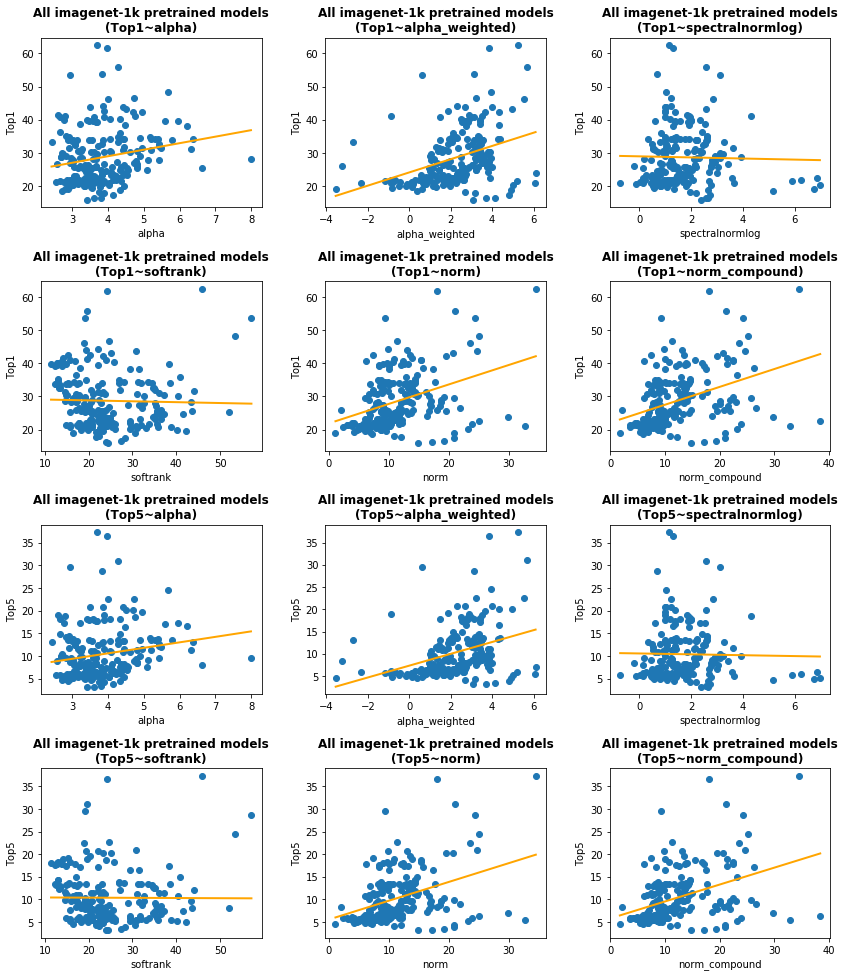

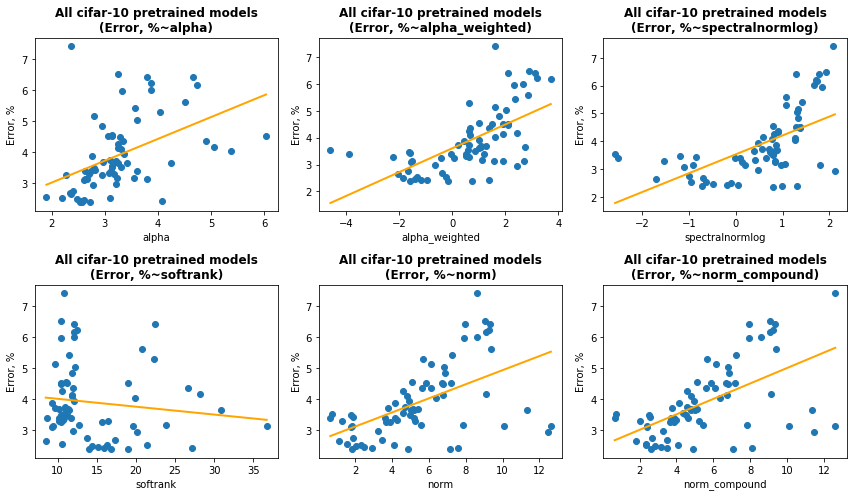

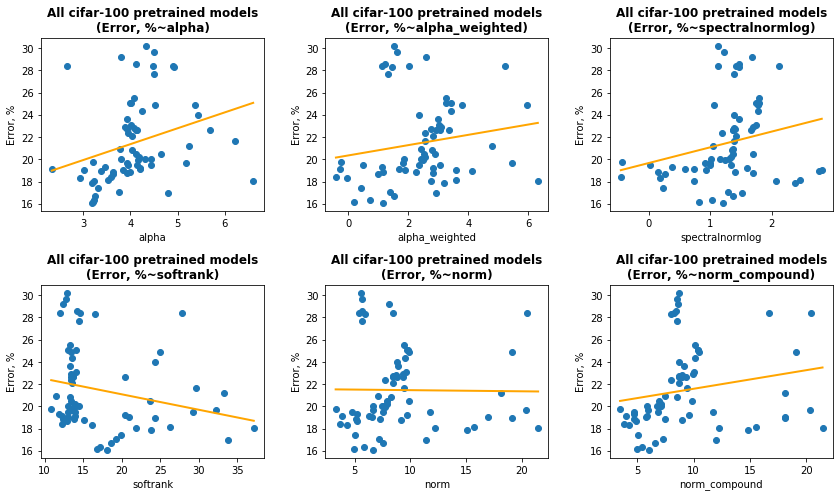

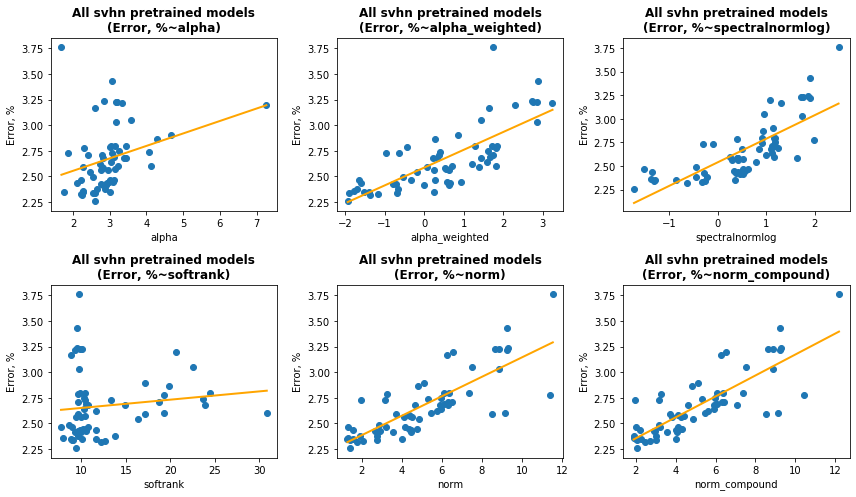

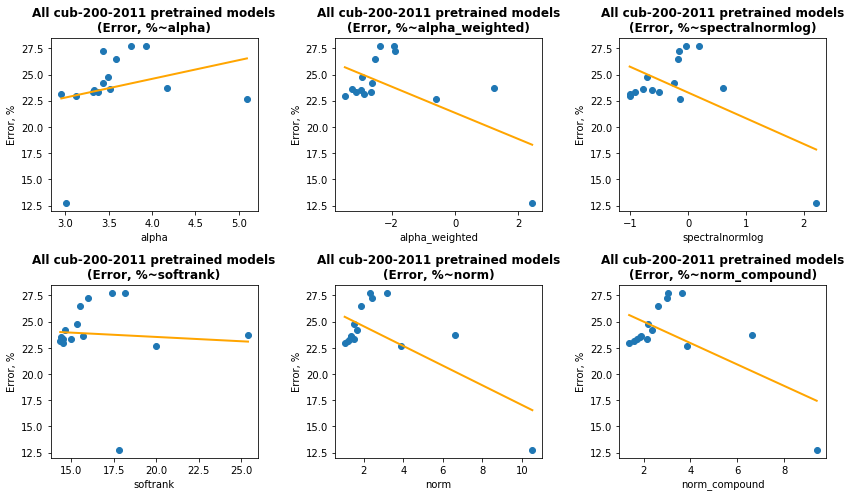

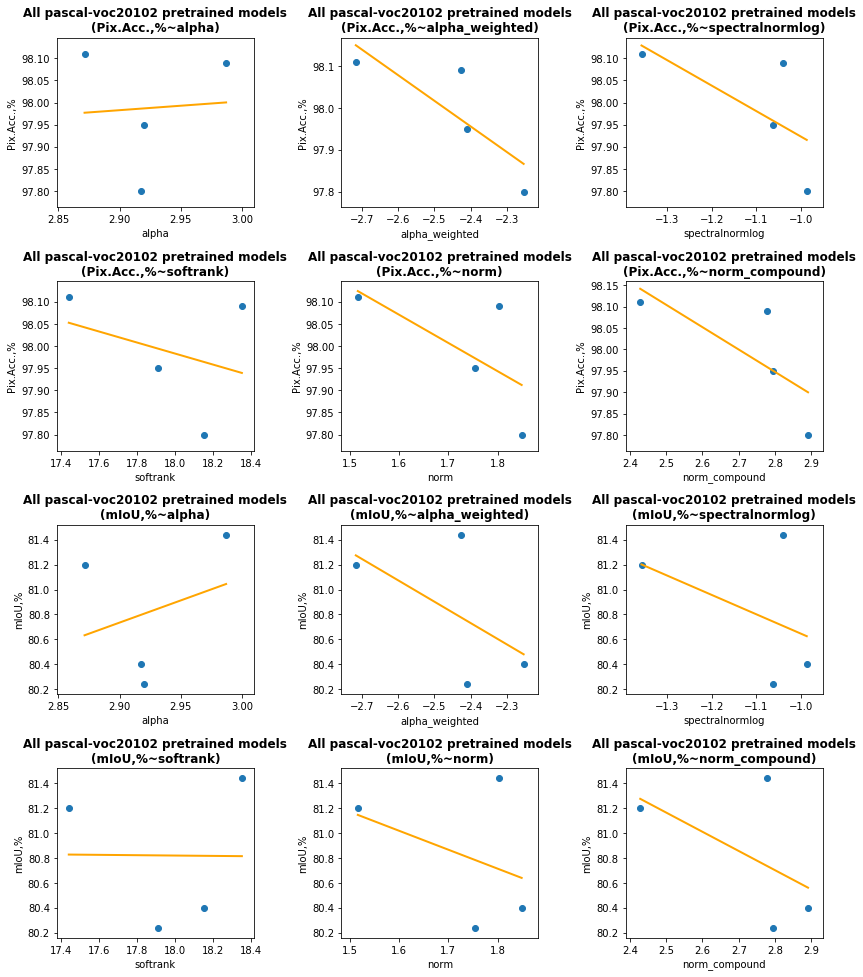

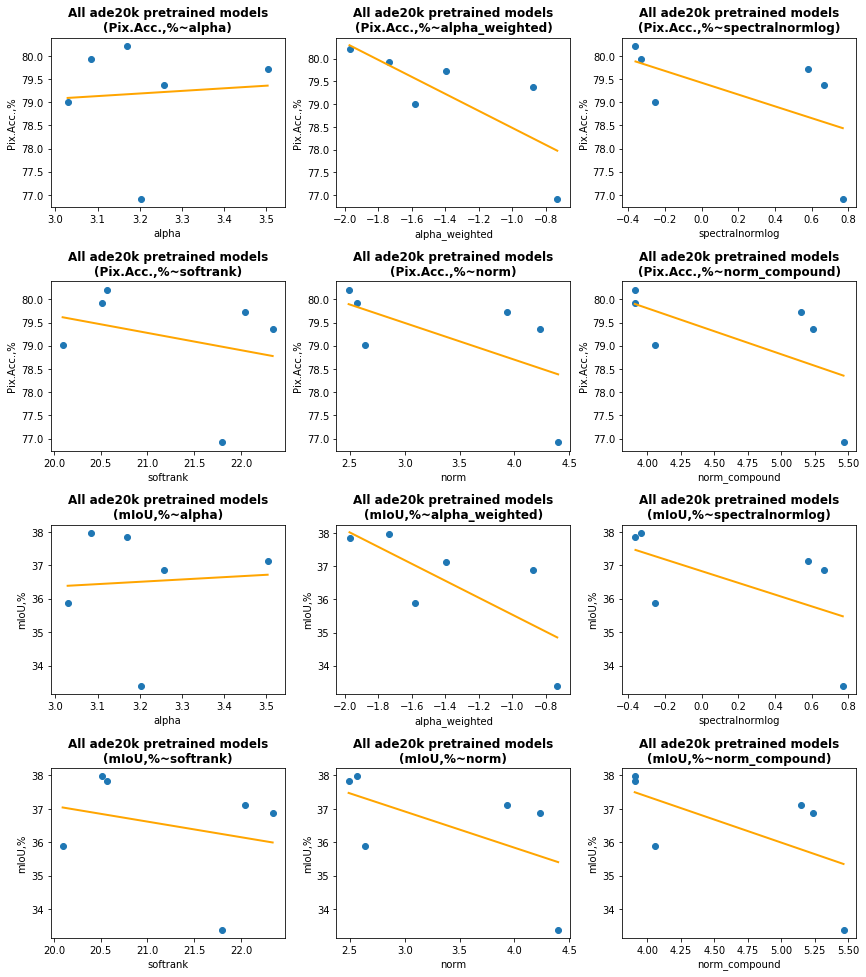

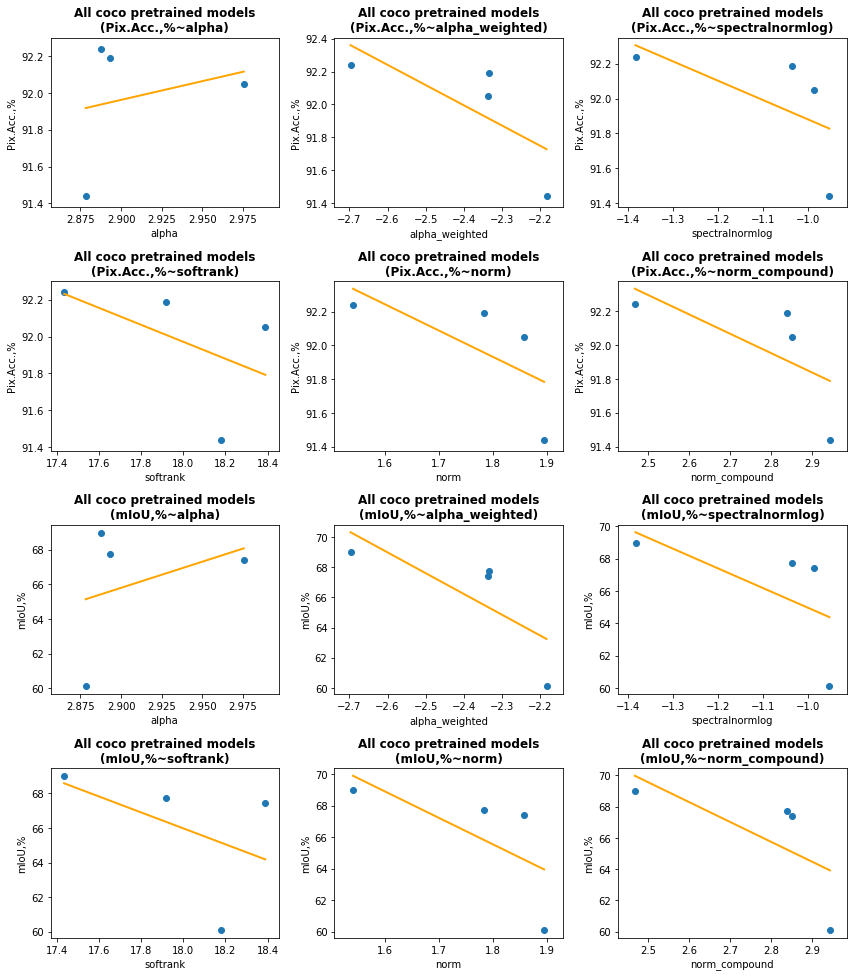

In [28]:
%matplotlib inline
plot_fit = True

'''Plotting by datasets'''
df_fit0 = []

for d in datasets:
    temp = df_full[d].copy()

    if len(temp) == 1:
        continue

    tacc = [c for c in metrics_acc if c in temp.columns]

    #plotloc = int(len(tacc)*len(metrics)/num_rows*100 + 10*num_cols + 1)
    plotrow = int(len(tacc)*len(metrics)/num_rows)
    plotcol = num_cols
    plotidx = 1

    if len(tacc) > 1:
        plt.figure(figsize = (12,20))
    else:
        plt.figure(figsize = (12,10))

    for ac in tacc:
        for x in metrics:
            plt.subplot(plotrow, plotcol, plotidx) #plt.subplot(plotloc)
            plt.scatter(temp[x], temp[ac])
            plt.xlabel(x)
            plt.ylabel(ac)
            plt.title('All {} pretrained models\n({}~{})'.format(d, ac, x), 
                      fontweight = 'bold')

            if plot_fit == True:
                temp = temp.dropna().reset_index(drop = True)
                this_fit = sm.OLS(temp[ac], sm.add_constant(temp[x])).fit()
                this_x = np.linspace(min(temp[x]), max(temp[x]), 1000)
                plt.plot(this_x, this_fit.predict(sm.add_constant(this_x)), linewidth = 2, color = 'orange')
                df_fit0.append([d, ac, x, this_fit.ssr/len(temp), this_fit.rsquared])
            
            #plotloc += 1
            plotidx += 1

    plt.tight_layout()

del temp
del tacc

if df_fit0 != []:
    df_fit0 = pd.DataFrame(df_fit0, columns = ['dataset', 'test accuracy', 'x variable', 'MSE', 'r^2'])

In [29]:
if type(df_fit0) != list:
    print(df_fit0.head(20)) #print the first 20 rows of the regression fit

        dataset test accuracy       x variable        MSE       r^2
0   imagenet-1k          Top1            alpha  67.578902  0.040266
1   imagenet-1k          Top1   alpha_weighted  60.925664  0.134753
2   imagenet-1k          Top1  spectralnormlog  70.378301  0.000510
3   imagenet-1k          Top1         softrank  70.365816  0.000687
4   imagenet-1k          Top1             norm  60.848892  0.135843
5   imagenet-1k          Top1    norm_compound  59.861566  0.149865
6   imagenet-1k          Top5            alpha  31.809400  0.032816
7   imagenet-1k          Top5   alpha_weighted  28.672194  0.128204
8   imagenet-1k          Top5  spectralnormlog  32.876215  0.000378
9   imagenet-1k          Top5         softrank  32.887501  0.000035
10  imagenet-1k          Top5             norm  28.096935  0.145695
11  imagenet-1k          Top5    norm_compound  27.806200  0.154535
12     cifar-10      Error, %            alpha   1.131283  0.207936
13     cifar-10      Error, %   alpha_weighted  

# Drop additional NaN models that somehow went wrong here

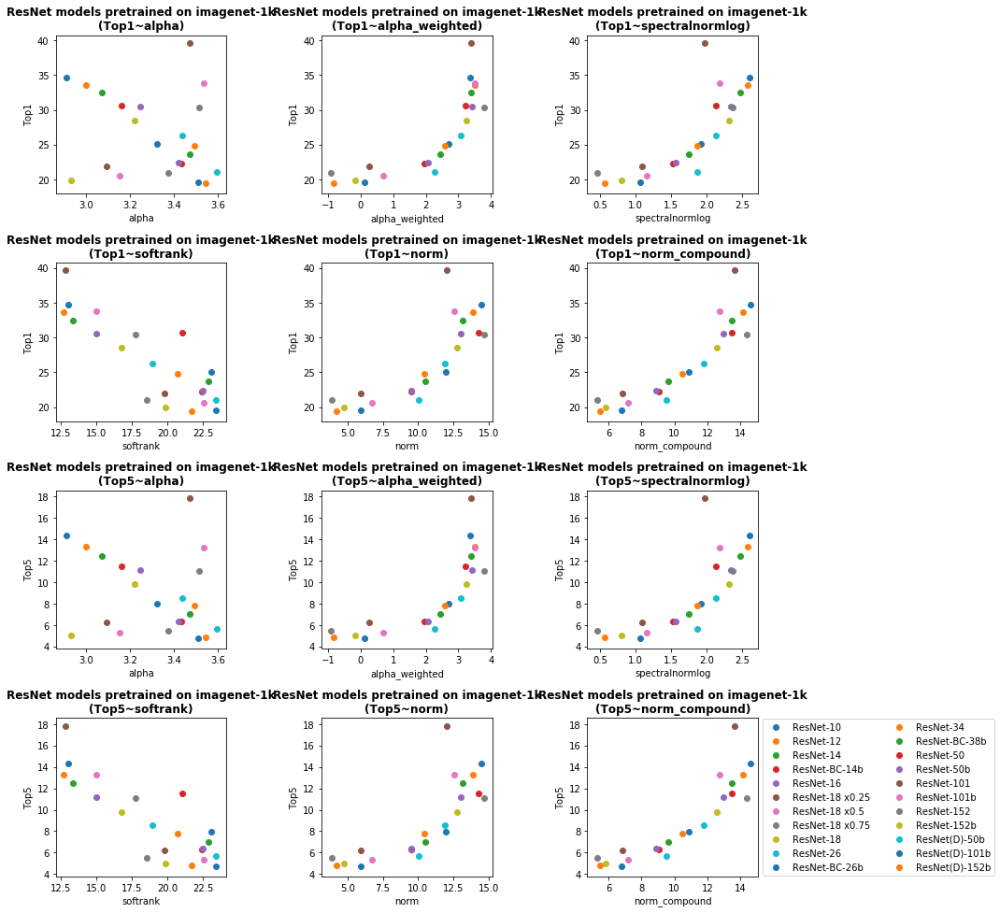

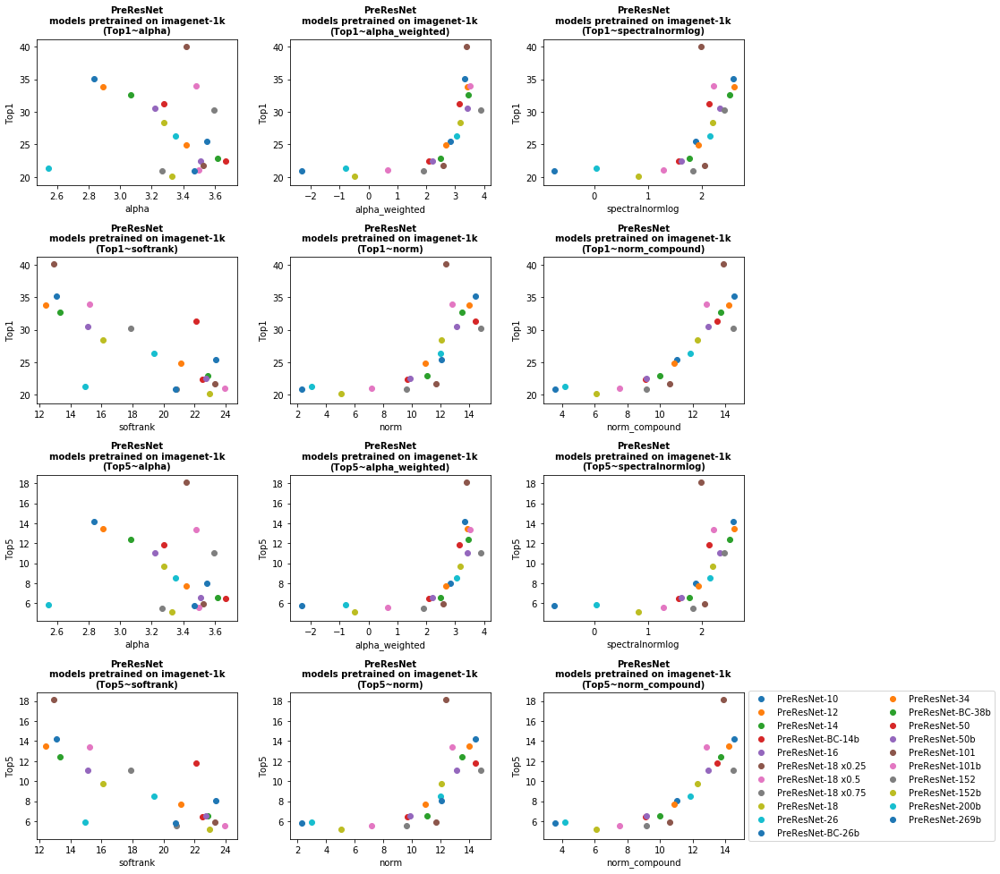

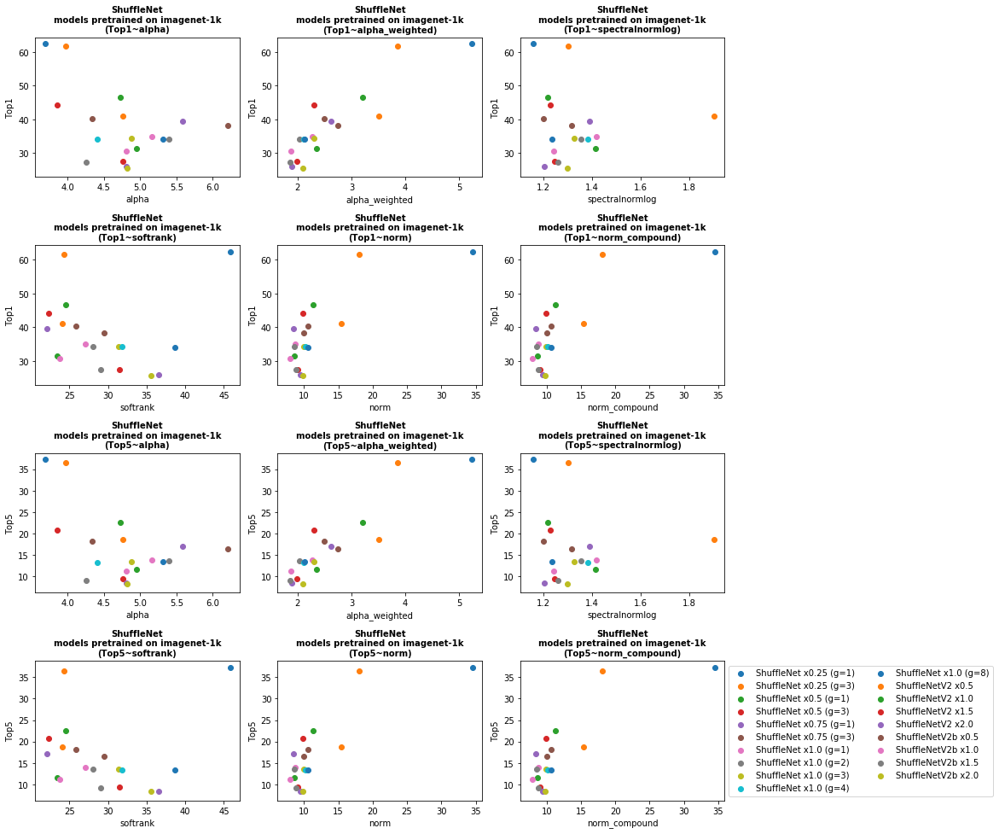

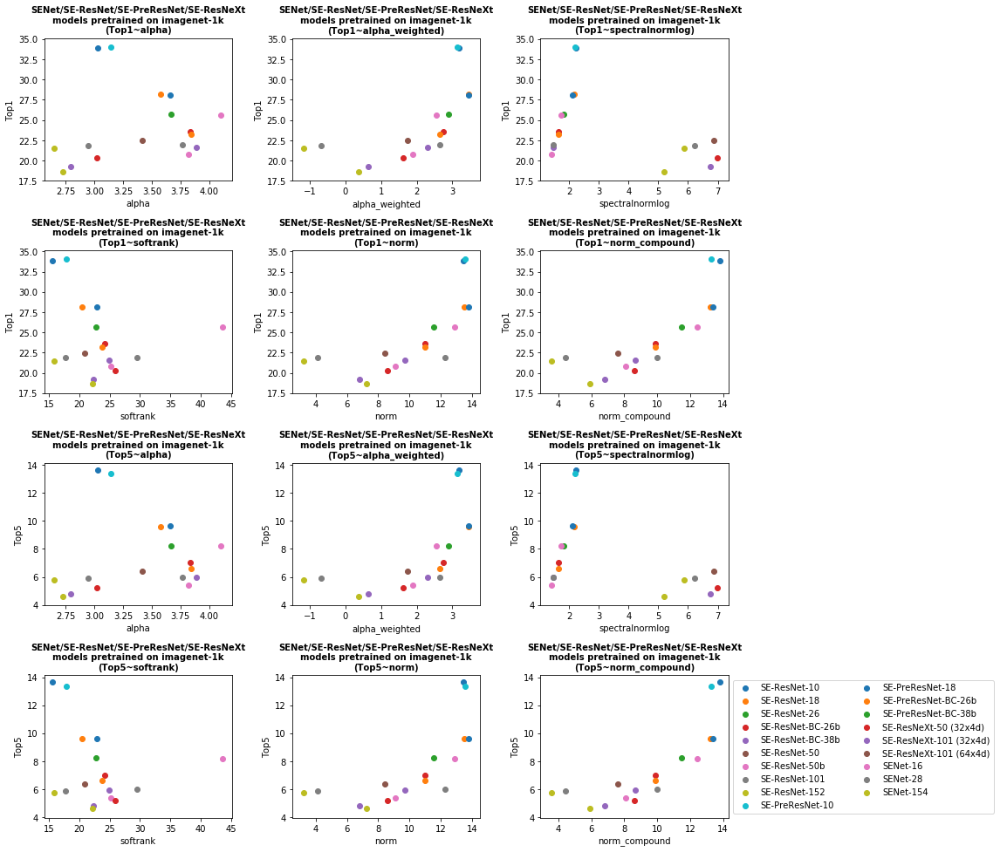

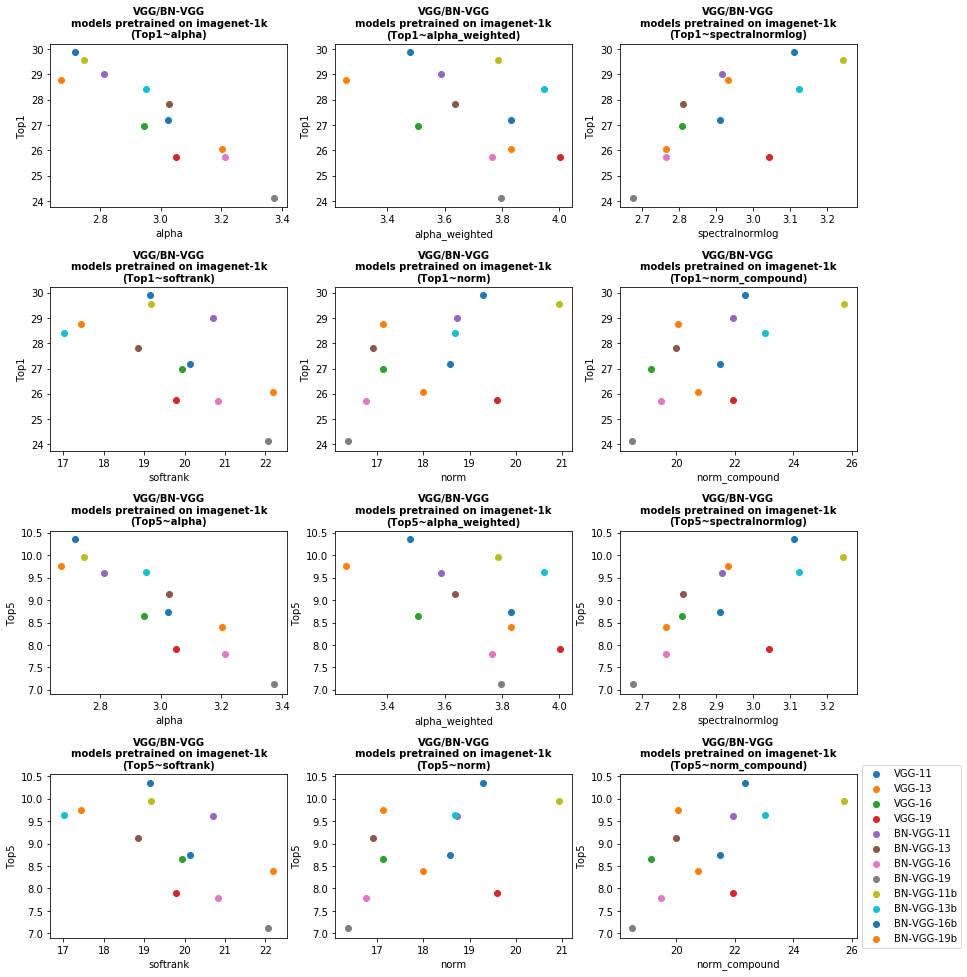

...

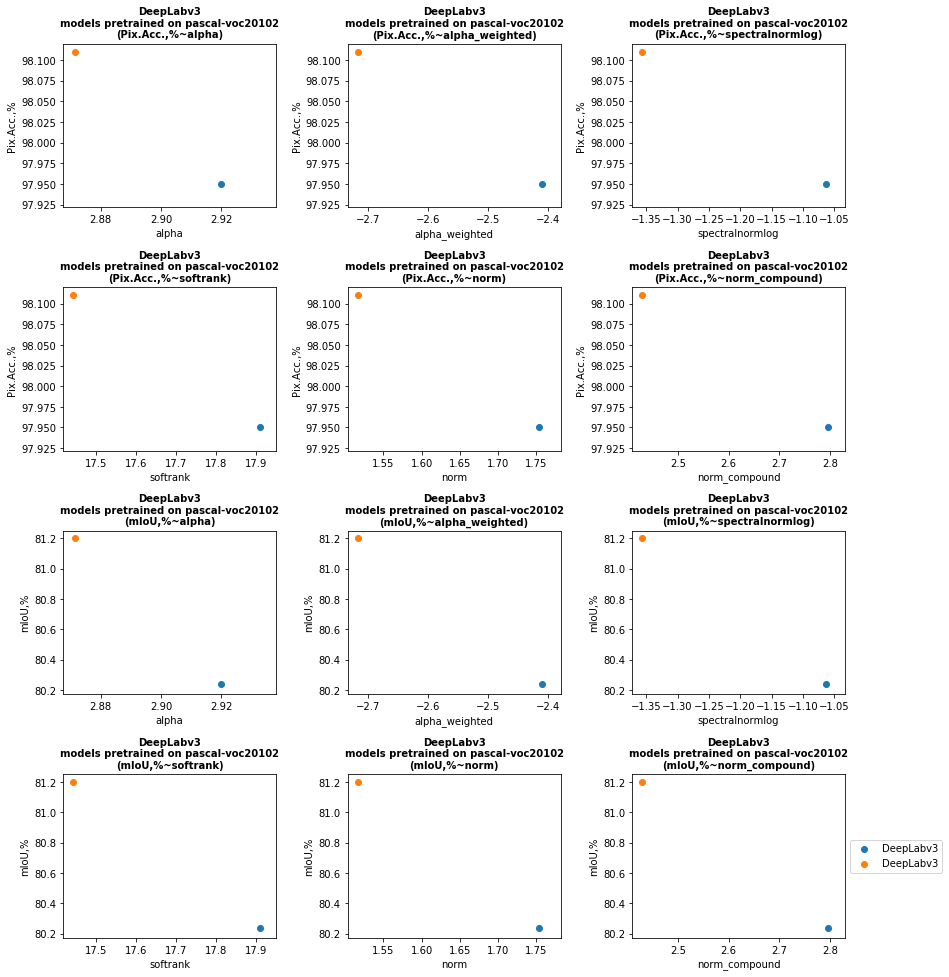

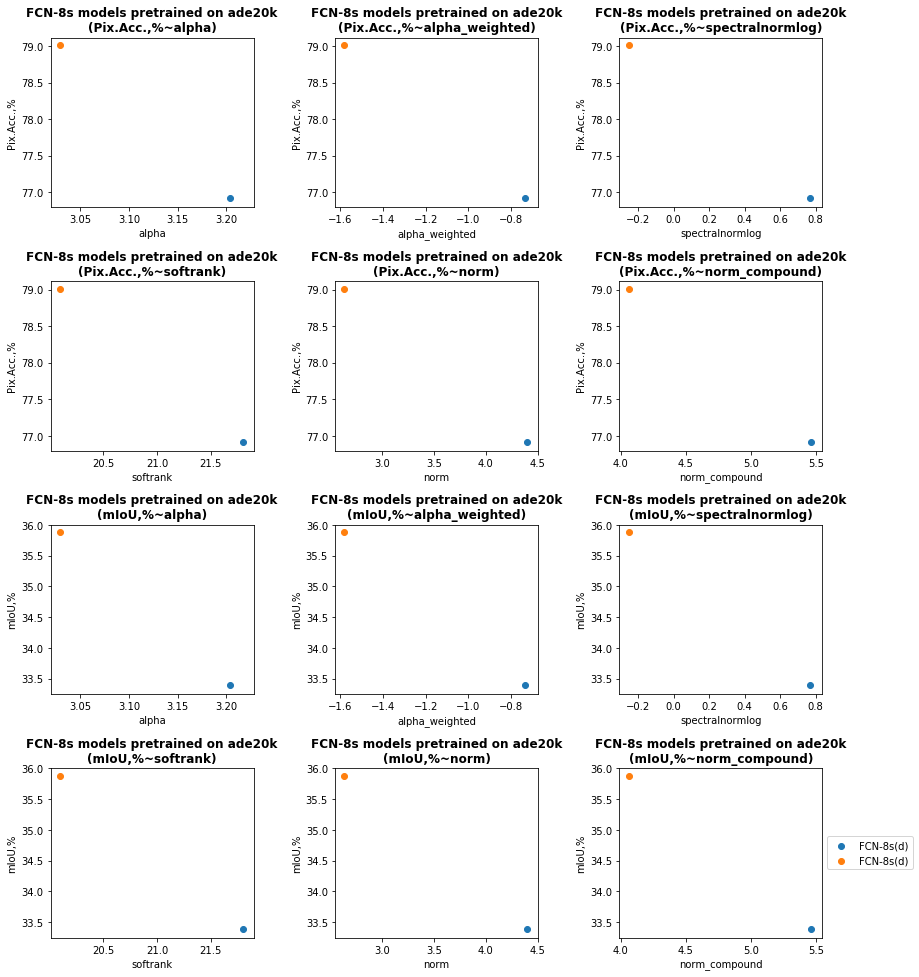

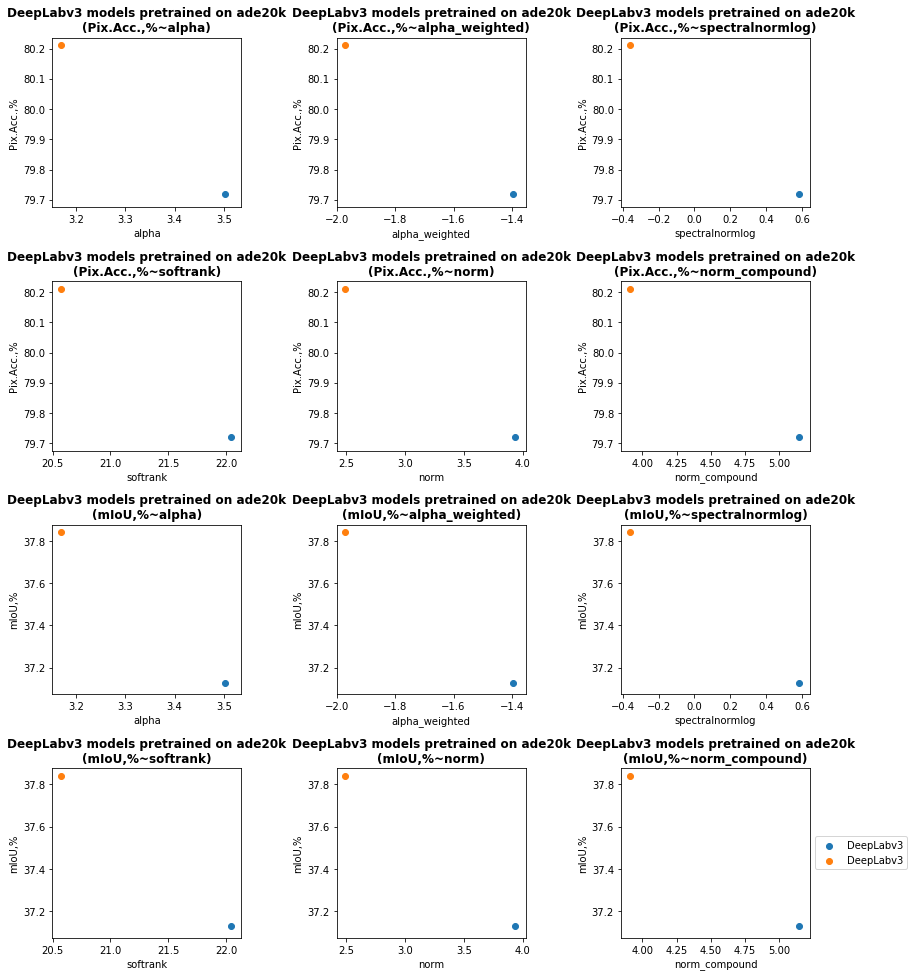

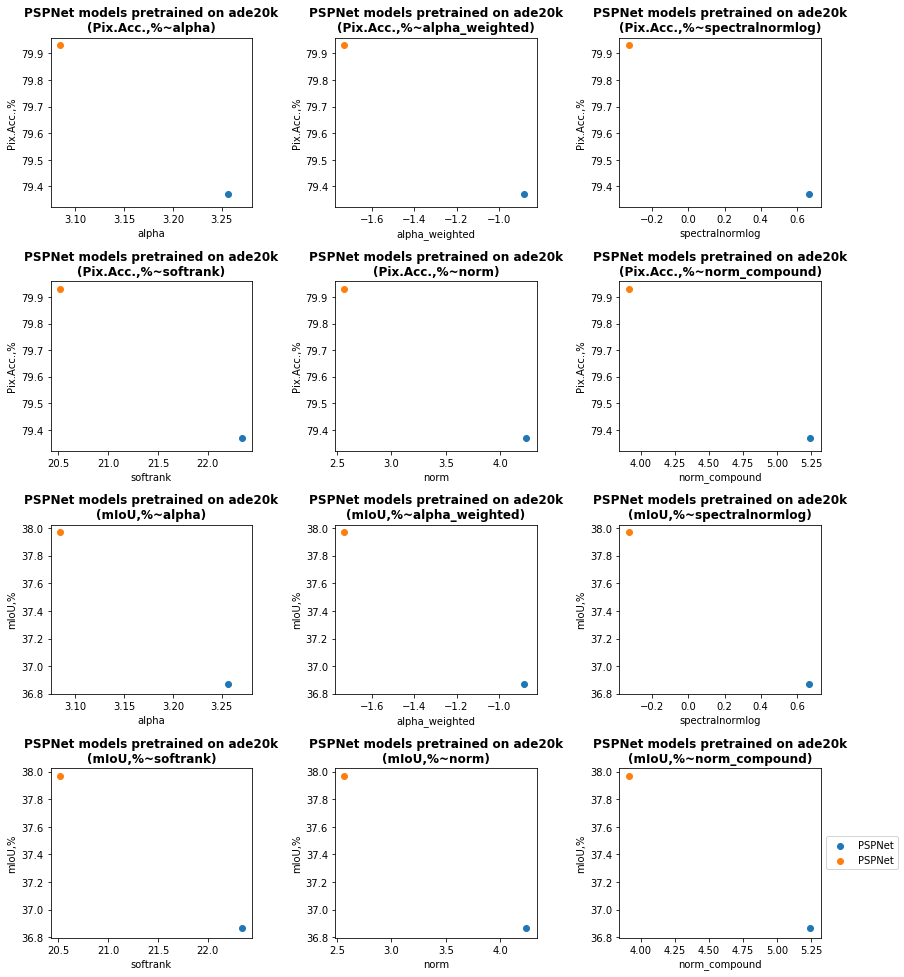

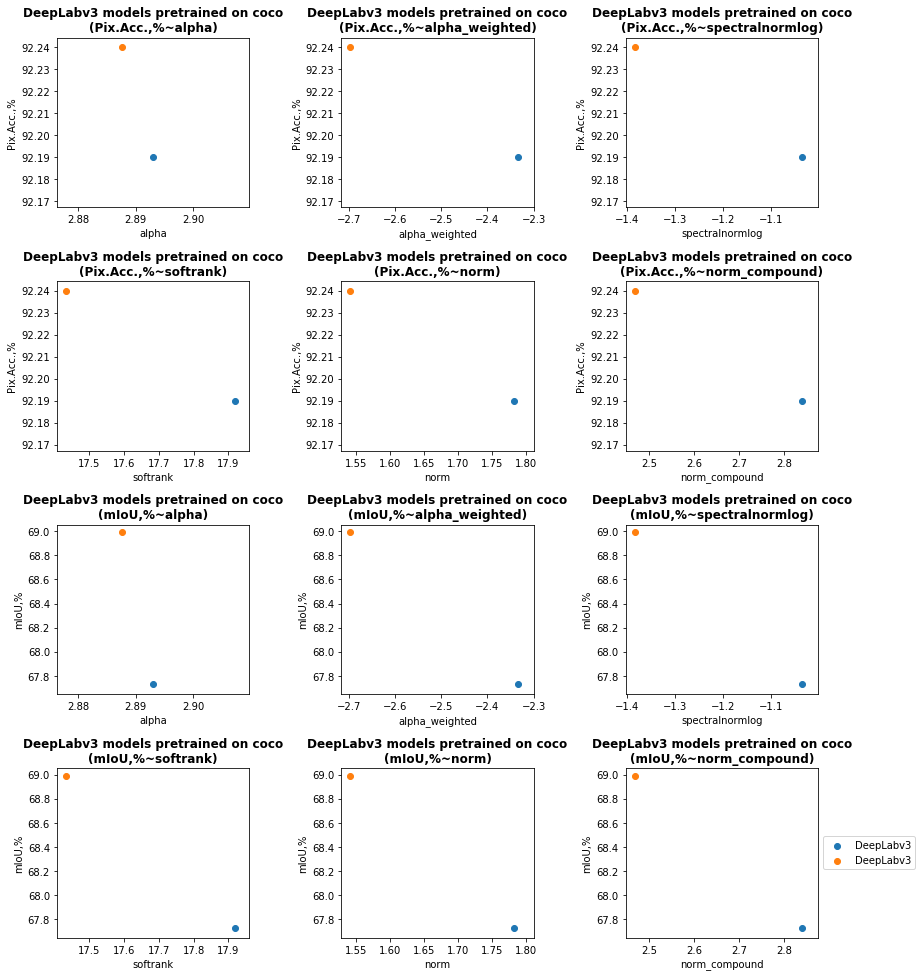

In [37]:
'''Plotting by architectures within each datasets'''
groups = df_table['group'].value_counts().to_frame()

for d in datasets:
    df = df_full[d].copy()
    this_groups = df['group'].value_counts().to_frame()

    for g in this_groups[this_groups['group'] > 1].index:

        this_group = df[df['group'] == g].copy()
        this_group = this_group.reset_index(drop = True)

        tacc = [c for c in metrics_acc if c in this_group.columns]

        #plotloc = int(len(tacc)*len(metrics)/num_rows*100 + 10*num_cols + 1)
        plotrow = int(len(tacc)*len(metrics)/num_rows)
        plotcol = num_cols
        plotidx = 1

        if len(tacc) > 1:
            plt.figure(figsize = (12,20))
        else:
            plt.figure(figsize = (12,10))

        for ac in tacc:#metrics_acc:
            for x in metrics:
                plt.subplot(plotrow, plotcol, plotidx) #plt.subplot(plotloc)
                for i in range(len(this_group)):
                    plt.scatter(this_group.loc[i,x], this_group.loc[i, ac])
                plt.xlabel(x)
                plt.ylabel(ac)
                if (len(g) > 20) | (len(g) + len(d) >= 20): #To avoid overlap in title
                    plt.title('{}\nmodels pretrained on {}\n({}~{})'.format(g, d, ac, x), 
                              fontweight = 'bold', fontsize = 10)
                else:
                    plt.title('{} models pretrained on {}\n({}~{})'.format(g, d, ac, x), 
                              fontweight = 'bold')

                #plotloc += 1
                plotidx += 1

            #plt.legend(this_group['Model'], loc='center left',bbox_to_anchor=(1, 0.5))          
          
        plt.tight_layout()
            
        if len(this_group['Model']) > 12:
            plt.legend(this_group['Model'], loc='center left', ncol = 2, bbox_to_anchor=(1, 0.5))                      
        else:
            plt.legend(this_group['Model'], loc='center left', bbox_to_anchor=(1, 0.5))  

del this_groups
del this_group
del df

# Fit a linear regression on to the graphs from above


/usr/local/lib/python3.6/dist-packages/numpy/core/fromnumeric.py:2495: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


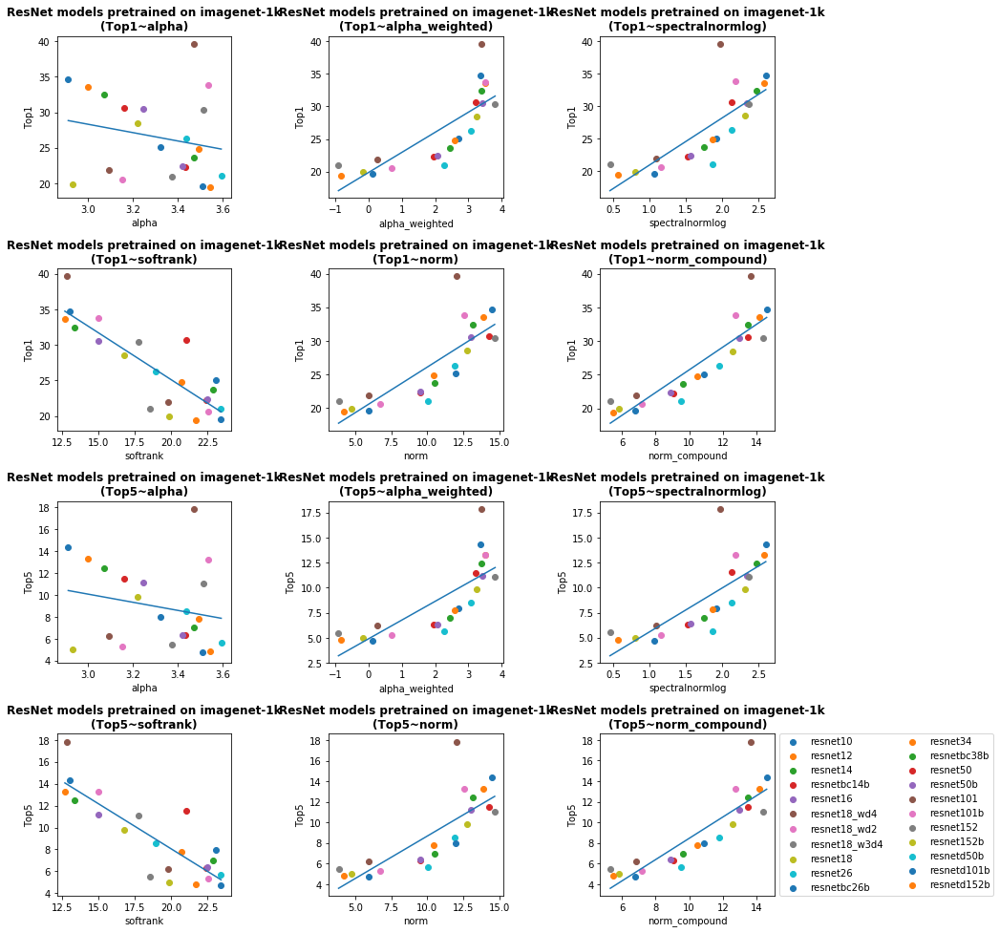

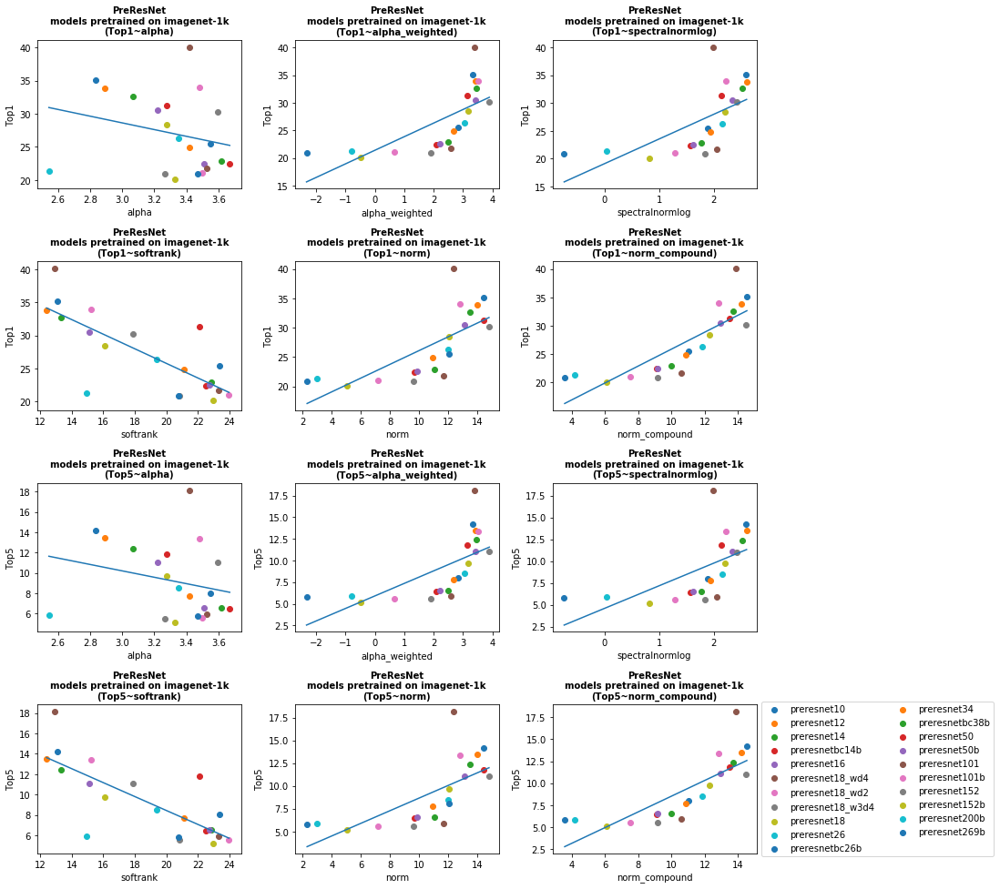

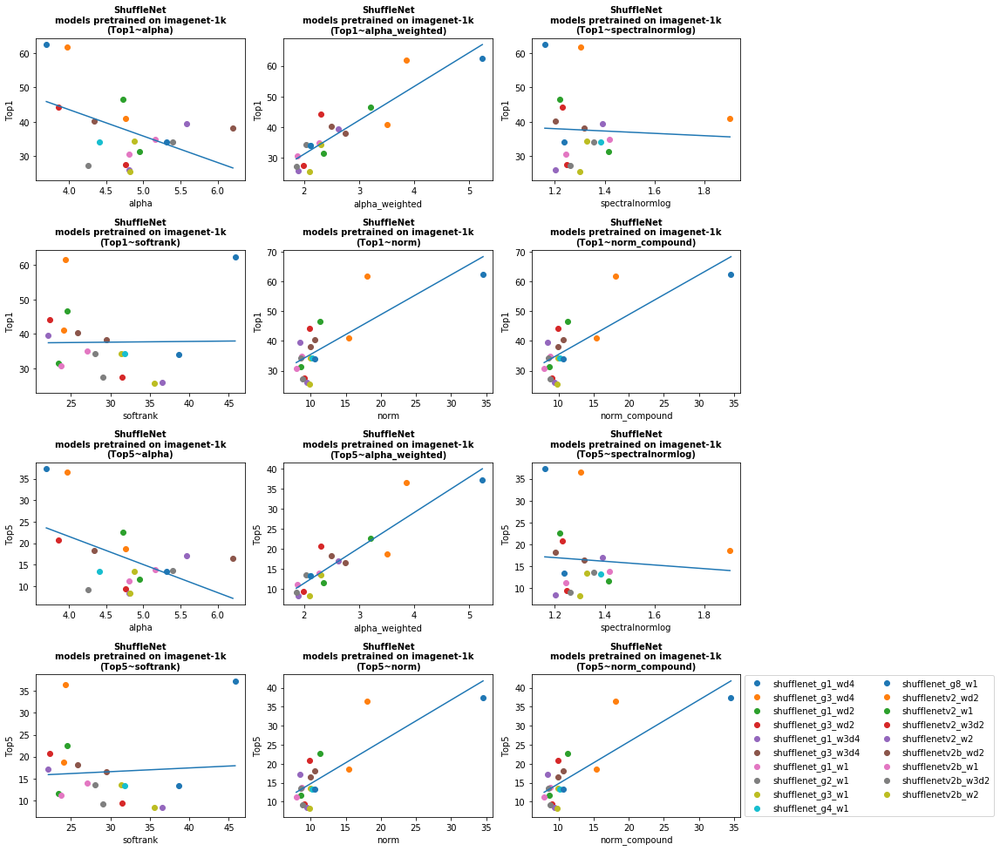

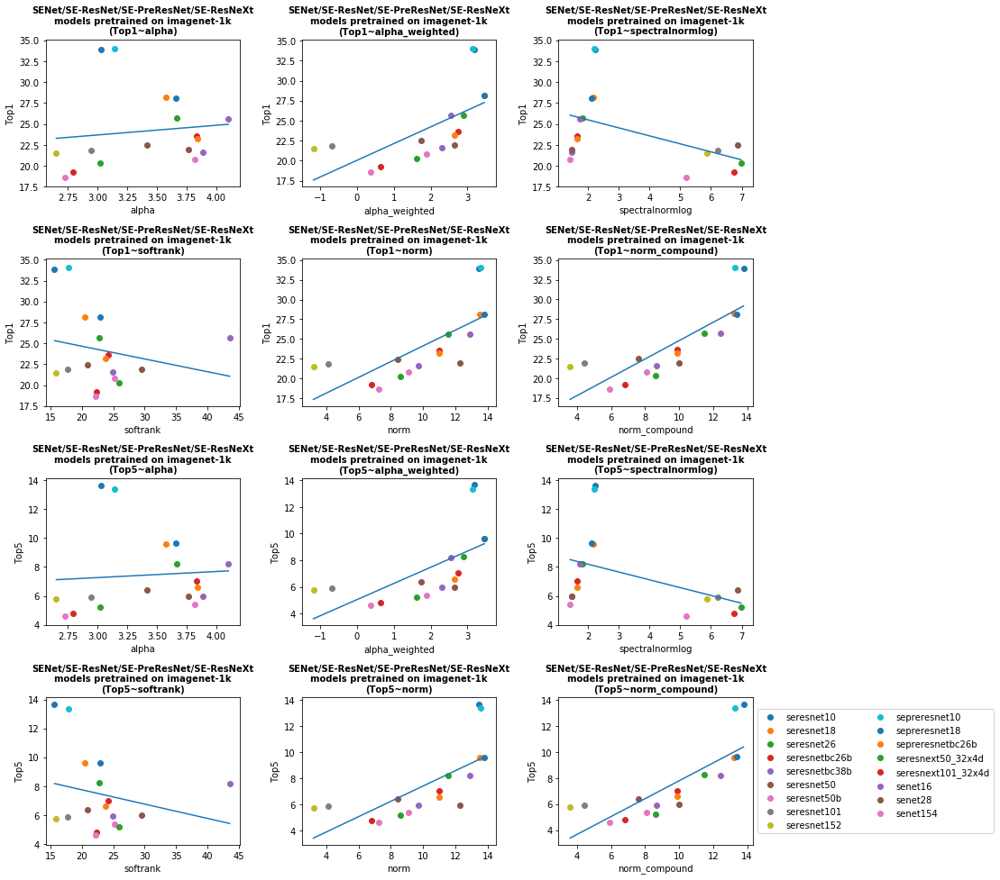

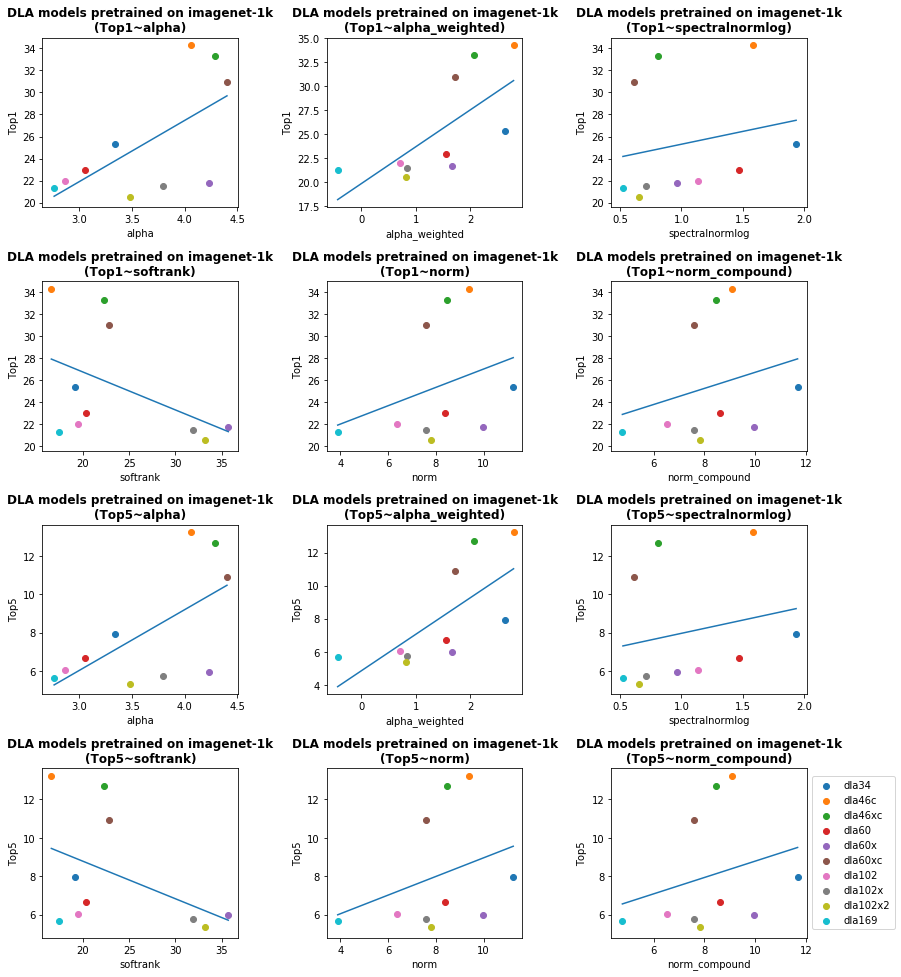

...

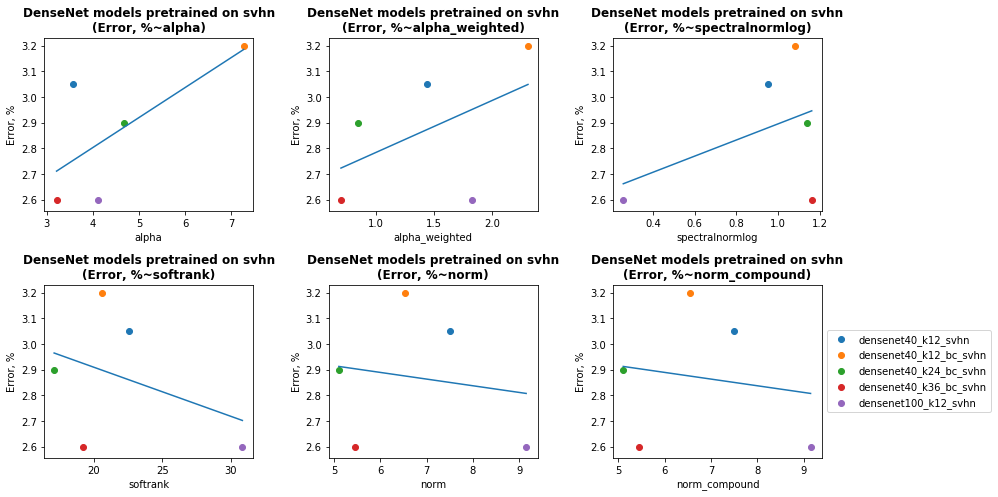

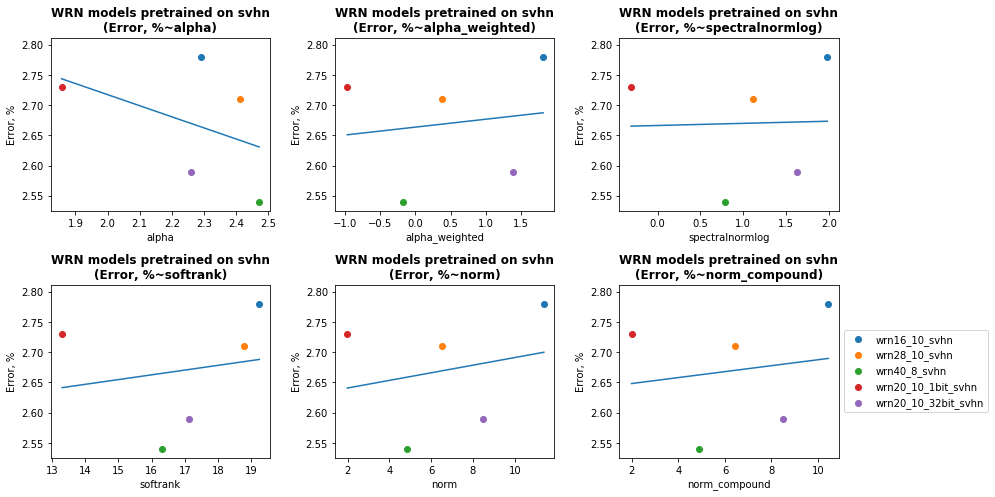

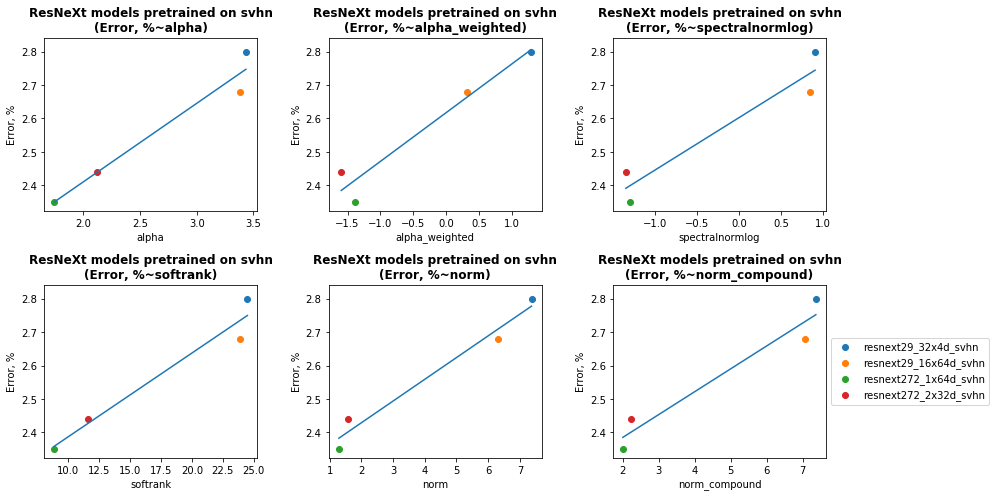

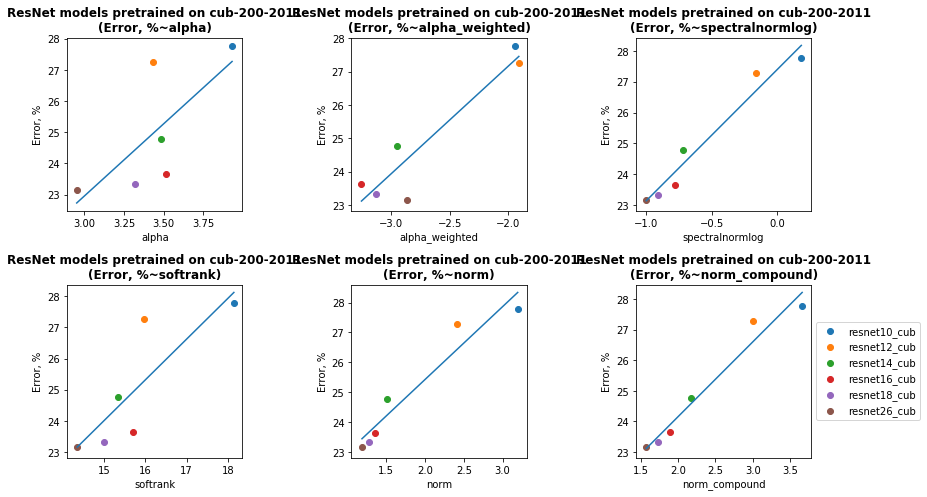

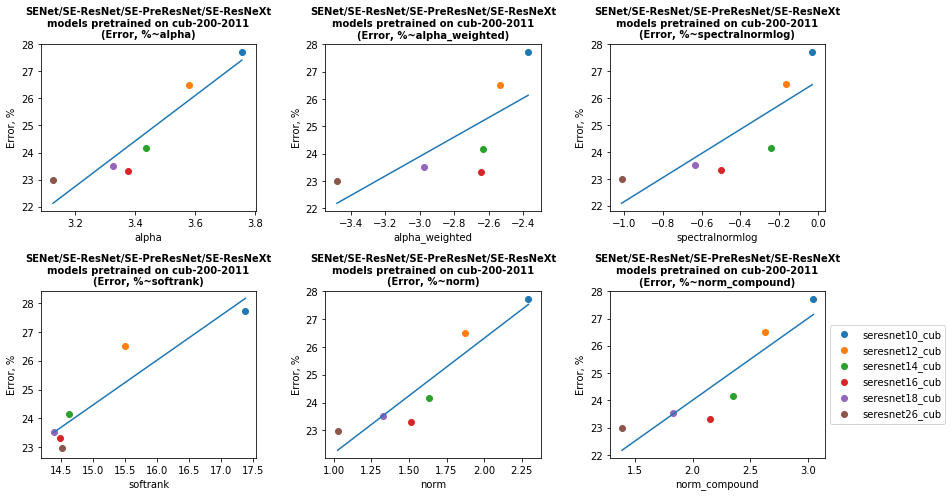

In [40]:
'''Fit a simple or polynomial on to the graph from above
ALL SIMPLE LINEAR FIT

Drop models that have less than 3 datapoints and incorrect fit

output:
-------------------
1. Plots
2. df_fit (next cell): records the X, Y, degree, SSE and MSE for the fit'''


#ply_degree = 2
df_fit = []
todelete = False
for d in datasets:
    df = df_full[d].copy()

    df.dropna(inplace=True)
    this_groups = df['group'].value_counts().to_frame()


    for g in this_groups[this_groups['group'] > 1].index:

        this_group = df[df['group'] == g].copy()
        this_group = this_group.dropna().reset_index(drop = True)
        n = len(this_group) #size

        if n <= 2:
            continue

        tacc = [c for c in metrics_acc if c in this_group.columns]

        #plotloc = int(len(tacc)*len(metrics)/num_rows*100 + 10*num_cols + 1)
        plotrow = int(len(tacc)*len(metrics)/num_rows)
        plotcol = int(num_cols)
        plotidx = 1

        if len(tacc) > 1:
            plt.figure(figsize = (12,20))
        else:
            plt.figure(figsize = (12,10))
        
        #if the size is too small, fit a linear reg; otherwise, fit a polynomial
        if n > 1000: #10: 
            this_deg = 2
        else:
            this_deg = 1
            
        for ac in tacc:#metrics_acc:
            for x in metrics:

                try:
                  plt.subplot(plotrow, plotcol, plotidx) #plt.subplot(plotloc)
                  for i in range(len(this_group)):
                      plt.scatter(this_group.loc[i,x], this_group.loc[i, ac], label = this_group.loc[i, 'modelname'])
                  plt.xlabel(x)
                  plt.ylabel(ac)
                  if (len(g) > 20) | (len(g) + len(d) >= 20):
                      plt.title('{}\nmodels pretrained on {}\n({}~{})'.format(g, d, ac, x), 
                                fontweight = 'bold', fontsize = 10)
                  else:
                      plt.title('{} models pretrained on {}\n({}~{})'.format(g, d, ac, x), 
                                fontweight = 'bold')

                
                  # this_fit = np.polyfit(this_group[x], this_group[ac], 
                  #                       this_deg ,full = True)
                  # coef = this_fit[0]
                  this_fit = sm.OLS(this_group[ac], sm.add_constant(this_group[x])).fit()
                  if (x == 'alpha_weighted') & (this_fit.params[1] < 0):
                      todelete = True

                  coef = this_fit.params[x] #this_fit[0]
                  this_x = np.linspace(min(this_group[x]), max(this_group[x]), 50)

                  plt.plot(this_x, this_fit.predict(sm.add_constant(this_x))) ##coef[0]*this_x**2 + coef[1]*this_x + coef[2]) 

                  try:
                      this_sse = this_fit.ssr ##this_fit[1][0]
                      this_rsquared = this_fit.rsquared
                  except:
                      pass
                      # try:
                      #     this_sse = np.sum((coef[0]*this_group[x]**2 + coef[1]*this_group[x] + coef[2] - this_group[ac])**2)
                      # except:
                      #     this_sse = np.sum((coef[0]*this_group[x] + coef[1] - this_group[ac])**2)                                

                  this_arch = [d, g, ac, x, this_deg, n, this_rsquared, this_sse, this_sse/n]

                except np.linalg.LinAlgError: #does not converge
                    print("{} did not converge {}".format(d))
                    this_arch = [d, g, ac, x, this_deg, n, 'Not converge', np.nan, np.nan]

                df_fit.append(this_arch)
                #plotloc += 1
                plotidx += 1

            #plt.legend(loc='center left', bbox_to_anchor=(1, 0.5)) #this_group['Model']
        plt.tight_layout()

        if len(this_group['Model']) > 12:
            plt.legend(loc='center left', ncol = 2, bbox_to_anchor=(1, 0.5))                      
        else:
            plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  

        if todelete:
            plt.close()
            todelete = False

del df
del this_group
del this_sse

In [46]:
df_fit = pd.DataFrame(df_fit, columns = ['Dataset', 'Archtecture', 'Test Accuracy', 
                                          'x Variable', 'Poly Degree','# of Models', 
                                         'r^2', 'SSE', 'MSE'])
df_fit = df_fit[df_fit['# of Models'] > 2].reset_index(drop = True)
print("number of records {}".format(len(df_fit)))
df_fit.dropna(inplace=True)

df_fit

number of records 438


,Dataset,Archtecture,Test Accuracy,x Variable,Poly Degree,# of Models,r^2,SSE,MSE
0,imagenet-1k,ResNet,Top1,alpha,1,22,0.045179,702.484761,31.931126
1,imagenet-1k,ResNet,Top1,alpha_weighted,1,22,0.645207,261.029609,11.864982
2,imagenet-1k,ResNet,Top1,spectralnormlog,1,22,0.633382,269.729732,12.260442
3,imagenet-1k,ResNet,Top1,softrank,1,22,0.723904,203.130801,9.233218
4,imagenet-1k,ResNet,Top1,norm,1,22,0.660706,249.626999,11.346682
...,...,...,...,...,...,...,...,...,...
433,cub-200-2011,SENet/SE-ResNet/SE-PreResNet/SE-ResNeXt,"Error, %",alpha_weighted,1,6,0.533981,8.811927,1.468655
434,cub-200-2011,SENet/SE-ResNet/SE-PreResNet/SE-ResNeXt,"Error, %",spectralnormlog,1,6,0.691262,5.837915,0.972986
435,cub-200-2011,SENet/SE-ResNet/SE-PreResNet/SE-ResNeXt,"Error, %",softrank,1,6,0.865666,2.540109,0.423351
436,cub-200-2011,SENet/SE-ResNet/SE-PreResNet/SE-ResNeXt,"Error, %",norm,1,6,0.870936,2.440468,0.406745


In [0]:
## df_fit records the X, Y, SSE, and MSE for the fit
df_fit.to_excel(path + '/' + 'df_fit.xlsx')


In [47]:
for x in ['r^2', 'MSE']:
    temp = df_fit.copy()
    temp = temp[temp['# of Models'] > 5].reset_index(drop = True)
    df_fitp = temp.pivot_table(values = x, columns = 'x Variable', 
                            index = ['Dataset', 'Archtecture', 'Test Accuracy'])

    print('For ' + x + ':')
    summary = df_fitp.describe()
    display(summary)
    print('===============================================')

del df_fitp

For r^2:


x Variable,alpha,alpha_weighted,norm,norm_compound,softrank,spectralnormlog
count,45.000000,45.000000,45.000000,45.000000,45.000000,45.000000
mean,0.401054,0.505013,0.473542,0.522044,0.378109,0.471981
std,0.304164,0.285285,0.328658,0.322063,0.296448,0.306554
min,0.000684,0.000555,0.000371,0.000197,0.000168,0.000033
25%,0.167657,0.297921,0.101363,0.268068,0.080893,0.222705
50%,0.397506,0.493685,0.517273,0.583716,0.369730,0.522821
75%,0.682820,0.730274,0.763892,0.816973,0.602733,0.688169
max,0.940872,0.926687,0.940314,0.963553,0.887213,0.958524


For MSE:


x Variable,alpha,alpha_weighted,norm,norm_compound,softrank,spectralnormlog
count,45.000000,45.000000,45.000000,45.000000,45.000000,45.000000
mean,10.386110,6.180578,7.586684,7.144319,10.079880,9.924699
std,16.415956,7.965561,9.607901,10.562654,19.476128,19.850131
min,0.000173,0.001146,0.000549,0.001940,0.001238,0.000515
25%,0.414332,0.474707,0.294550,0.251480,0.497155,0.426481
50%,4.341922,2.310082,2.944641,2.582398,3.667721,2.011123
75%,12.519716,10.598917,10.600865,9.606092,10.485513,8.338775
max,82.770885,40.556593,41.242623,46.155514,103.932140,103.669419


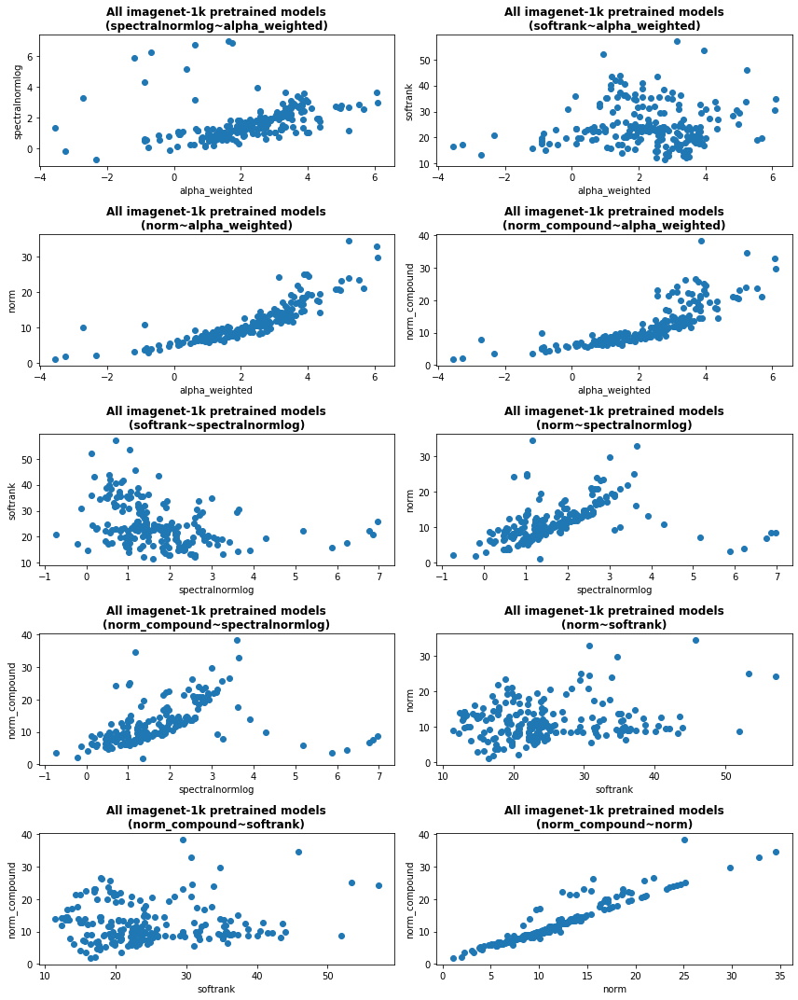

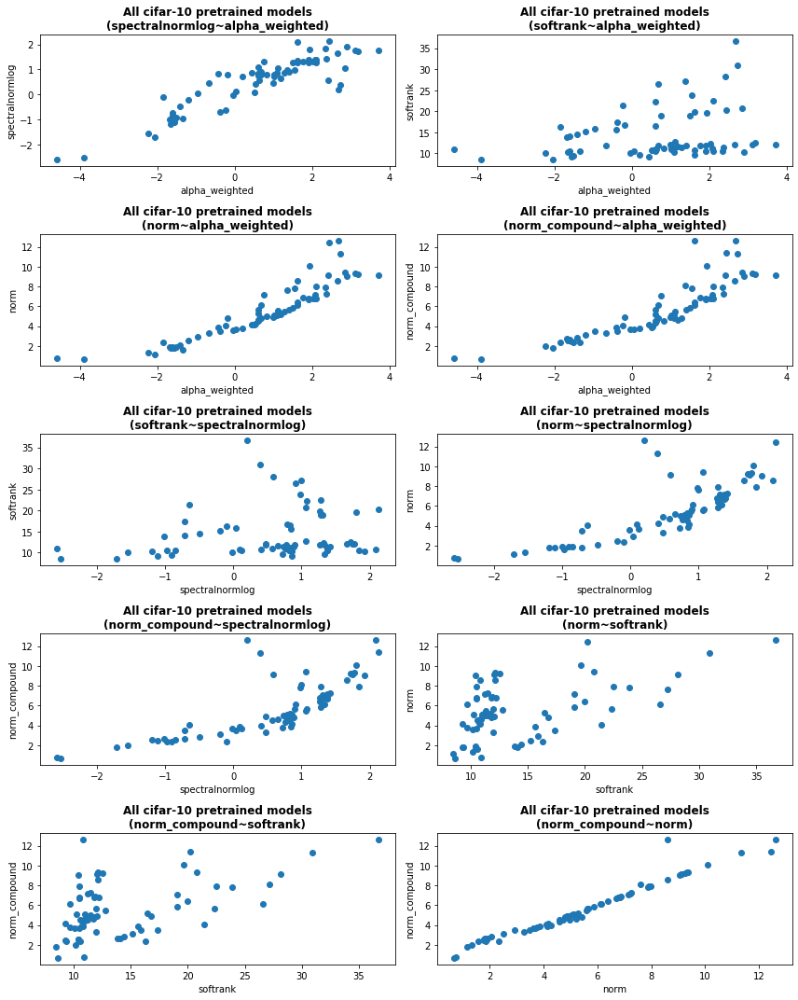

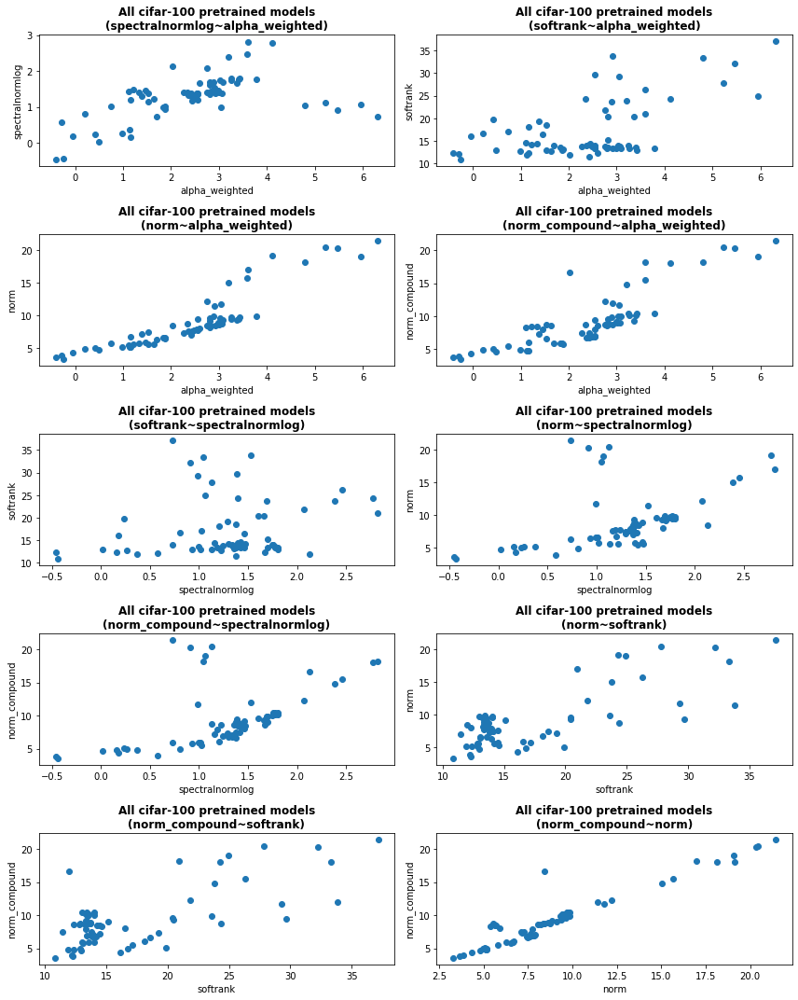

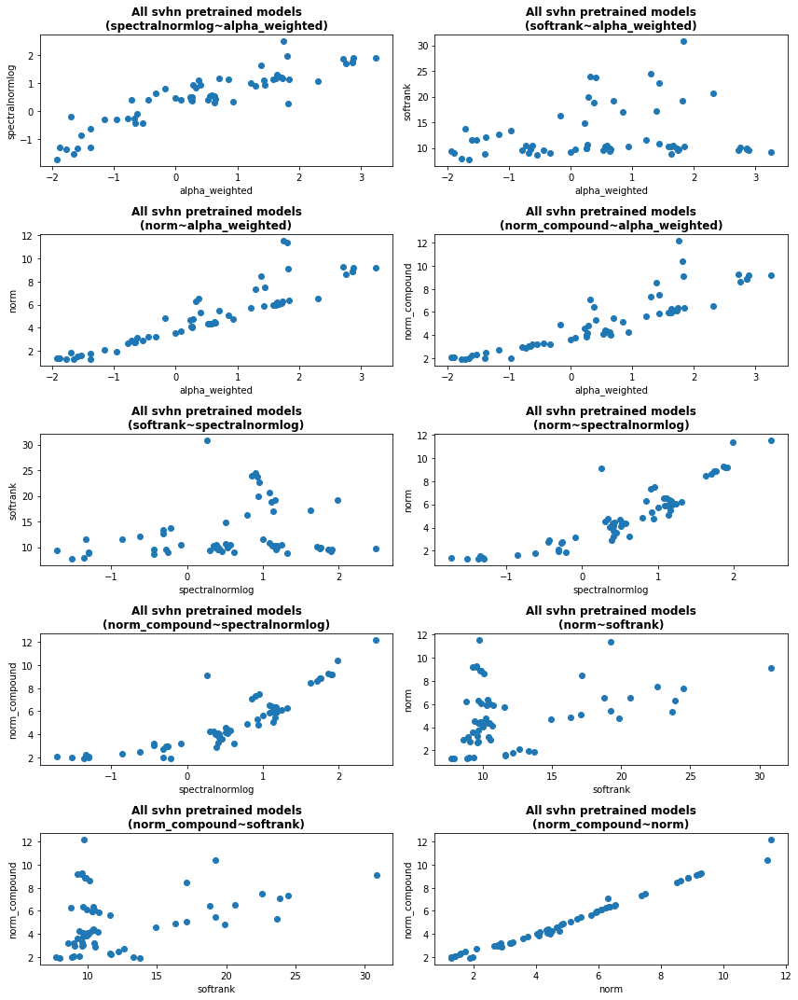

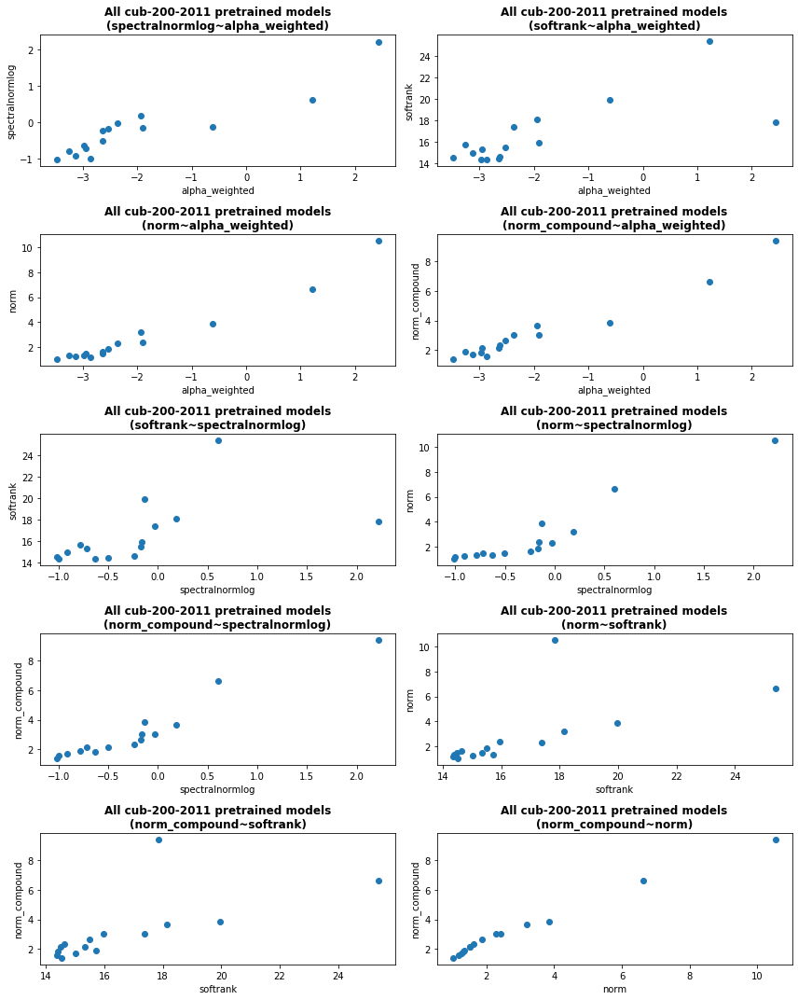

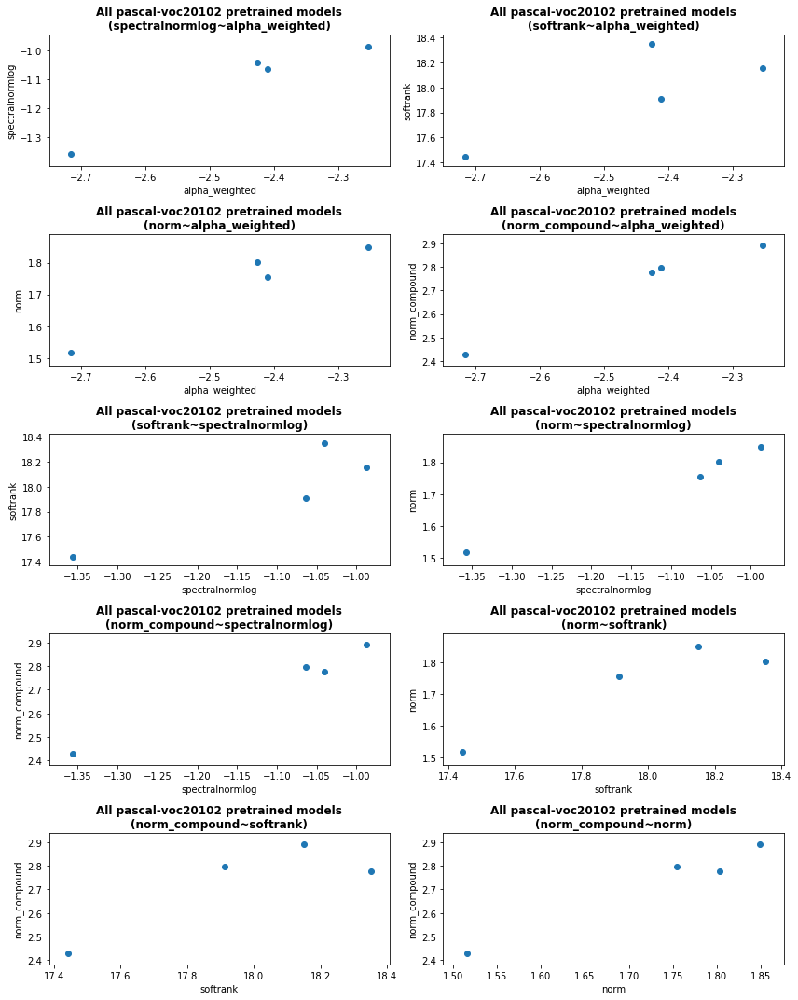

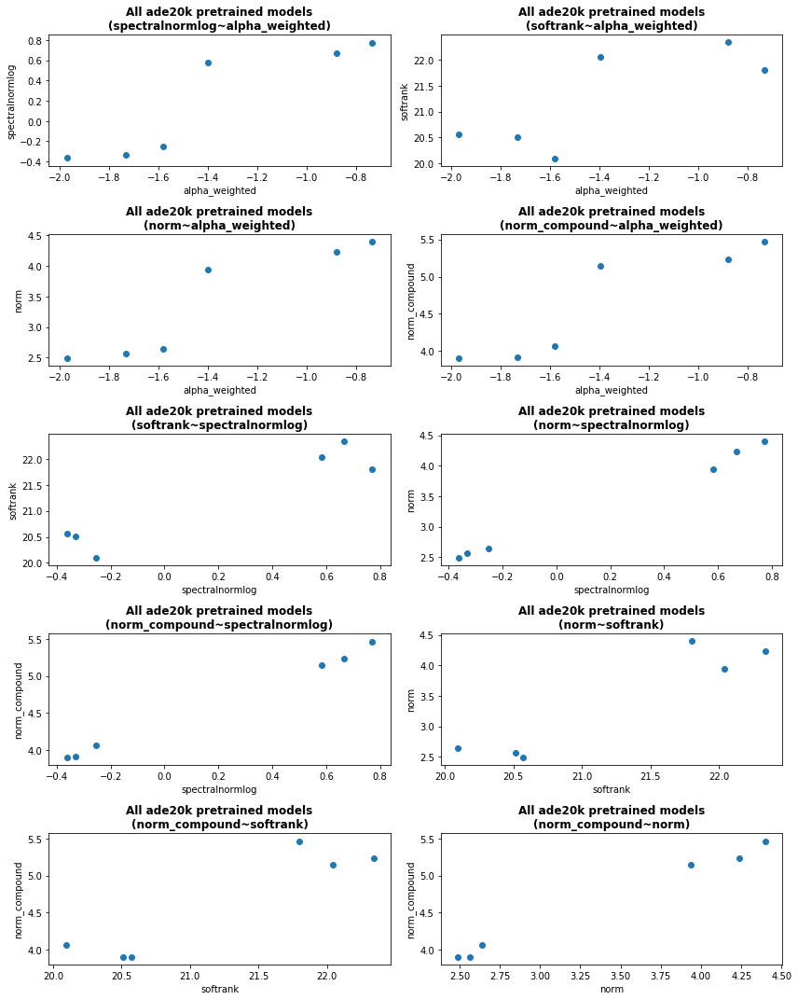

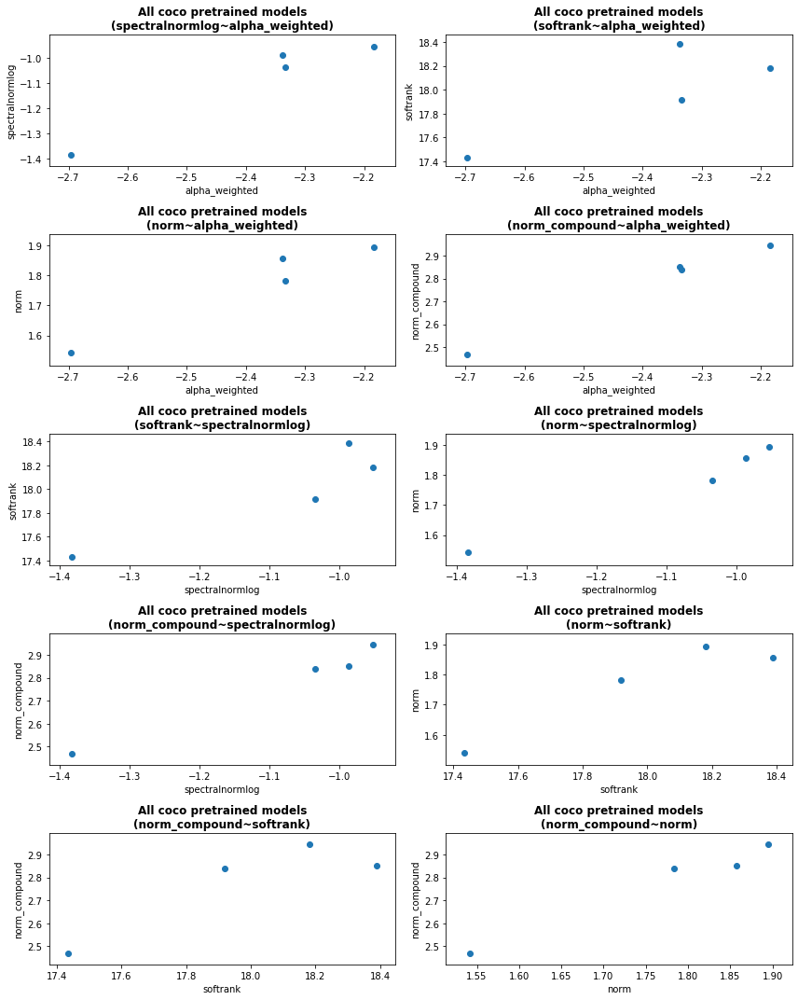

In [61]:
'''Between the ww metrics
with alpha_weighted'''

for d in datasets:
    temp = df_full[d].copy()
    df = temp.dropna()
    if len(temp) == 1:
        continue

    xys = list(itertools.combinations(metrics[1:],2)) #list(itertools.combinations(metrics[:1] + metrics[2:],2))
    
    if len(xys)%2 == 0:
       plotrow = int(len(xys)/2)
       plotcol = 2
       plotidx = 1
    elif len(xys)%3 == 0:
       plotrow = int(len(xys)/3)
       plotcol = 3
       plotidx = 1

    plt.figure(figsize = (12, 3*plotrow))
    for x, y in xys: #tertools.combinations(metrics[:1] + metrics[2:],2):
        plt.subplot(plotrow, plotcol, plotidx) #plt.subplot(plotloc)
        plt.scatter(df[x], df[y])
        plt.xlabel(x)
        plt.ylabel(y)
        plt.title('All {} pretrained models\n({}~{})'.format(d, y, x), 
                  fontweight = 'bold')
        #plt.figure(figsize = (10,10))
        #plt.show()

        #plotloc += 1
        plotidx += 1
    
    plt.tight_layout()

del temp


## Analysis of *VGG* 

In [50]:
df = df_full['imagenet-1k'].copy()
vgg_df = df[df.Model.str.contains('VGG')]
display(vgg_df)

,Model,Top1,Top5,Params,FLOPs/2,modelname,group,alpha,alpha_compound,alpha_weighted,alpha_weighted_compound,lognorm,lognorm_compound,norm,norm_compound,numofSpikes,numofSpikes_compound,ratio_numofSpikes,ratio_numofSpikes_compound,sigma_mp,sigma_mp_compound,softrank,softrank_compound,softrank_mp,softrank_mp_compound,softranklog,softranklog_compound,softranklogratio,softranklogratio_compound,spectralnorm,spectralnorm_compound,index,spectralnormlog
4,VGG-11,29.90,10.36,132863336,"7,615.87M",vgg11,VGG/BN-VGG,2.718865,2.633820,3.481365,3.370006,1.233806,1.298991,19.289885,22.342350,44.060606,114.711111,0.139369,0.140960,0.841156,0.778246,19.147915,26.872275,0.146546,0.122237,1.226026,1.337490,2.051962,2.110676,22.458042,22.276894,5.0,3.111649
5,VGG-13,28.76,9.75,133047848,"11,317.65M",vgg13,VGG/BN-VGG,2.672990,2.613508,3.257229,3.213801,1.181416,1.245817,17.123001,20.066109,32.785714,90.981481,0.118980,0.122265,0.912626,0.846795,17.426775,23.828024,0.237108,0.197693,1.171739,1.274389,2.056506,2.102478,18.766037,19.301830,6.0,2.932049
6,VGG-16,26.98,8.65,138357544,"15,480.10M",vgg16,VGG/BN-VGG,2.946369,2.844555,3.506696,3.392841,1.196639,1.241135,17.114365,19.148439,27.315315,72.355556,0.099333,0.105788,0.922425,0.863068,19.942745,24.892550,0.251125,0.218548,1.231330,1.306745,2.117774,2.159014,16.585413,16.813160,7.0,2.808524
7,VGG-19,25.74,7.90,143667240,"19,642.55M",vgg19,VGG/BN-VGG,3.050589,2.916136,4.001597,3.871270,1.262272,1.304325,19.586618,21.946037,32.202899,76.271605,0.101164,0.106998,0.962772,0.918017,19.777029,23.862866,0.202296,0.178798,1.240724,1.299056,2.010615,2.030878,21.002823,22.353643,8.0,3.044657
8,BN-VGG-11,29.01,9.61,132866088,"7,630.21M",bn_vgg11,VGG/BN-VGG,2.812567,2.928575,3.587930,3.702219,1.240411,1.305899,18.735483,21.954311,37.757576,108.311111,0.124493,0.129079,0.868611,0.798428,20.698221,35.253017,0.159428,0.134574,1.246947,1.393973,2.061750,2.215805,18.470629,18.135994,9.0,2.916182
9,BN-VGG-13,27.83,9.13,133050792,"11,341.62M",bn_vgg13,VGG/BN-VGG,3.026542,3.076305,3.636423,3.717554,1.190826,1.256584,16.897371,19.998884,28.261905,83.462963,0.100390,0.108119,0.939661,0.866882,18.854864,31.623205,0.234773,0.197763,1.196496,1.331546,2.054343,2.187032,16.611366,16.671089,10.0,2.810087
10,BN-VGG-16,25.72,7.79,138361768,"15,506.38M",bn_vgg16,VGG/BN-VGG,3.211754,3.605223,3.766603,4.210686,1.192303,1.246804,16.749430,19.474054,24.243243,75.281481,0.081522,0.093148,0.937141,0.877388,20.830485,30.908893,0.264803,0.229815,1.235446,1.337244,2.120475,2.200735,15.854094,15.994361,11.0,2.763428
11,BN-VGG-19,24.13,7.12,143672744,"19,671.15M",bn_vgg19,VGG/BN-VGG,3.372452,3.716458,3.796408,4.174894,1.186471,1.230200,16.369974,18.503906,20.311594,61.401235,0.068296,0.079187,0.935045,0.883954,22.076058,30.252906,0.303914,0.269607,1.272805,1.352330,2.219333,2.279512,14.511257,14.629992,12.0,2.674925
12,BN-VGG-11b,29.56,9.96,132868840,"7,630.72M",bn_vgg11b,VGG/BN-VGG,2.746966,2.638104,3.785228,3.707938,1.272804,1.356785,20.929249,25.727139,48.969697,136.088889,0.151938,0.153106,0.856977,0.807802,19.167732,29.723293,0.124841,0.102099,1.215664,1.341722,1.970480,2.030214,25.637768,27.851130,13.0,3.244067
13,BN-VGG-13b,28.41,9.63,133053736,"11,342.14M",bn_vgg13b,VGG/BN-VGG,2.953078,2.816648,3.947539,3.839401,1.226191,1.305007,18.682676,23.043327,37.928571,113.500000,0.122668,0.130216,0.962256,0.896464,17.024751,26.425358,0.193310,0.159257,1.132871,1.256728,1.884227,1.957254,22.779263,25.033779,14.0,3.125851


In [52]:
display(vgg_df[['Model', 'Top1', 'alpha', 'norm', 'alpha_weighted']].sort_values('Top1').reset_index(drop = True))

,Model,Top1,alpha,norm,alpha_weighted
0,BN-VGG-19,24.13,3.372452,16.369974,3.796408
1,BN-VGG-16,25.72,3.211754,16.749430,3.766603
2,VGG-19,25.74,3.050589,19.586618,4.001597
3,BN-VGG-19b,26.06,3.202934,17.981234,3.830761
4,VGG-16,26.98,2.946369,17.114365,3.506696
5,BN-VGG-16b,27.19,3.025120,18.566490,3.833127
6,BN-VGG-13,27.83,3.026542,16.897371,3.636423
7,BN-VGG-13b,28.41,2.953078,18.682676,3.947539
8,VGG-13,28.76,2.672990,17.123001,3.257229
9,BN-VGG-11,29.01,2.812567,18.735483,3.587930


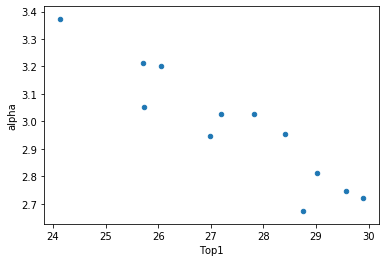

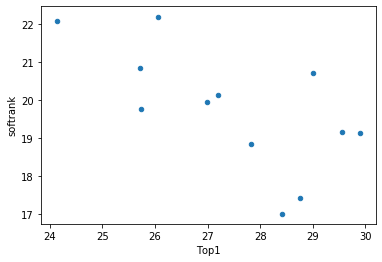

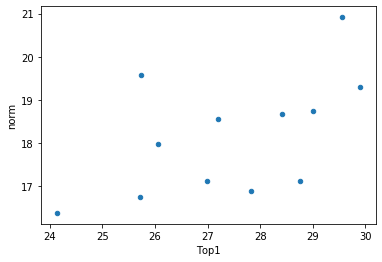

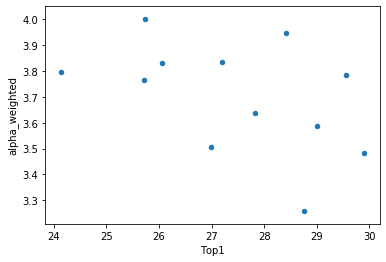

In [53]:
vgg_df.plot(x='Top1', y= 'alpha', kind='scatter')
vgg_df.plot(x='Top1', y= 'softrank', kind='scatter')
vgg_df.plot(x='Top1', y= 'norm', kind='scatter')
vgg_df.plot(x='Top1', y= 'alpha_weighted', kind='scatter')

## **HuggingFace Models**

### **1. Analyze all models using Weightwatcher**

In [0]:
!pip install pytorch-transformers

In [0]:
import pytorch_transformers as pt
import torch

In [64]:
hf_models = pd.read_html('https://huggingface.co/pytorch-transformers/pretrained_models.html')[0]
hf_models.head()

,Architecture,Shortcut name,Details of the model
0,BERT,bert-base-uncased,"12-layer, 768-hidden, 12-heads, 110M parameter..."
1,BERT,bert-large-uncased,"24-layer, 1024-hidden, 16-heads, 340M paramete..."
2,BERT,bert-base-cased,"12-layer, 768-hidden, 12-heads, 110M parameter..."
3,BERT,bert-large-cased,"24-layer, 1024-hidden, 16-heads, 340M paramete..."
4,BERT,bert-base-multilingual-uncased,"(Original, not recommended) 12-layer, 768-hidd..."


In [0]:
# PyTorch-Transformers has a unified API
# for 7 transformer architectures and 30 pretrained weights.
#          Model              | Tokenizer             | Pretrained weights shortcuts
MODELS = [(pt.BertModel,       pt.BertTokenizer,       hf_models.loc[hf_models['Architecture'] == 'BERT', 'Shortcut name'].tolist()),
          (pt.OpenAIGPTModel,  pt.OpenAIGPTTokenizer,  hf_models.loc[hf_models['Architecture'] == 'GPT', 'Shortcut name'].tolist()),
          (pt.GPT2Model,       pt.GPT2Tokenizer,       hf_models.loc[hf_models['Architecture'] == 'GPT-2', 'Shortcut name'].tolist()),
          (pt.TransfoXLModel,  pt.TransfoXLTokenizer,  hf_models.loc[hf_models['Architecture'] == 'Transformer-XL', 'Shortcut name'].tolist()),
          (pt.XLNetModel,      pt.XLNetTokenizer,      hf_models.loc[hf_models['Architecture'] == 'XLNet', 'Shortcut name'].tolist()),
          (pt.XLMModel,        pt.XLMTokenizer,        hf_models.loc[hf_models['Architecture'] == 'XLM', 'Shortcut name'].tolist()),
          (pt.RobertaModel,    pt.RobertaTokenizer,    hf_models.loc[hf_models['Architecture'] == 'RoBERTa', 'Shortcut name'].tolist()),
          (pt.DistilBertModel, pt.DistilBertTokenizer, hf_models.loc[hf_models['Architecture'] == 'DistilBERT', 'Shortcut name'].tolist())]


In [0]:
'''Run the HuggingFace Models'''
data_hf = {}
i = 0
for model_class, tokenizer_class, pretrained_weights in MODELS[6:]:
    # Load pretrained model/tokenizer
    #tokenizer = tokenizer_class.from_pretrained(pretrained_weights)
    
    for m in pretrained_weights:
        
        if (m == 'roberta-base') | (m == 'roberta-large'):
            continue
            
        s = time.time()
        model = model_class.from_pretrained(m)
        
        ## apply ww
        watcher = ww.WeightWatcher(model=model, logger=logger)
        results = watcher.analyze(alphas = True, spectralnorms=True, softranks=True)
        
        data_hf[m]=watcher.get_summary()
        e = time.time()
        
        print('\nTime spent to run {} model is {} minutes'.format(m, (e-s)/60.))
        print('----------------------------------------------------------------')
        
        df_hf = pd.DataFrame.from_dict(data_hf).transpose()
        df_hf.to_excel('/content/drive/My Drive/data_hf_{}.xlsx'.format(m))

        i += 0

In [69]:
try:
    df_hugging = pd.read_excel(path + '/df_hugging.xlsx')\
                .rename(columns = {'Unnamed: 0': 'Architecture'})
    df_hugging['Architecture'] = df_hugging['Architecture'].fillna(method = 'ffill')
except:
    print("Concating...")
    df_hugging = pd.DataFrame()
    for f in os.listdir(path):
        if f.startswith('data_hf'):
            temp = pd.read_excel(path + '/' + f)\
                        .rename(columns = {'Unnamed: 0':'modelname'})
            print(f)
            df_hugging = pd.concat([df_hugging, temp], axis = 0, sort = False)

    df_hugging = df_hugging.drop_duplicates().reset_index(drop = True)

    df_hugging = df_hugging.merge(hf_models.loc[:, ['Architecture',	'Shortcut name']],
                                  left_on = 'modelname', right_on = 'Shortcut name',
                                  how = 'left').drop(['Shortcut name'], axis = 1)

    df_hugging = df_hugging[['Architecture'] + df_hugging.columns[:-1].tolist()]

    del temp

    df_hugging = df_hugging.set_index(['modelname'])
    df_hugging = df_hugging.loc[hf_models['Shortcut name'],:].reset_index()

    df_hugging.to_excel(path + '/df_hugging.xlsx')

# if len(df_hugging) != len(hf_models):
#     print('Missing models')

df_hugging.head()

,Architecture,modelname,alpha,alpha_compound,alpha_weighted,alpha_weighted_compound,lognorm,lognorm_compound,norm,norm_compound,softrank,softrank_compound,softranklog,softranklog_compound,softranklogratio,softranklogratio_compound,spectralnorm,spectralnorm_compound
0,Bert,bert-base-uncased,4.006251,4.006251,5.520487,5.520487,1.566235,1.566235,41.571056,41.571056,56.459637,56.459637,1.662696,1.662696,2.407257,2.407257,420.008881,420.008881
1,Bert,bert-large-uncased,4.182942,4.182942,6.078965,6.078965,1.626763,1.626763,46.678444,46.678444,66.624610,66.624610,1.721711,1.721711,2.413127,2.413127,211.702621,211.702621
2,Bert,bert-base-cased,3.873442,3.873442,5.163987,5.163987,1.532904,1.532904,38.390232,38.390232,54.715865,54.715865,1.660536,1.660536,2.462148,2.462148,149.275208,149.275208
3,Bert,bert-large-cased,4.133658,4.133658,6.120481,6.120481,1.631184,1.631184,47.345066,47.345066,63.537351,63.537351,1.699848,1.699848,2.374098,2.374098,171.152267,171.152267
4,Bert,bert-base-multilingual-uncased,3.625840,3.625840,5.145978,5.145978,1.557176,1.557176,42.508667,42.508667,52.563356,52.563356,1.659431,1.659431,2.330454,2.330454,257.559631,257.559631


### **2. Plots**

<Figure size 720x1080 with 0 Axes>

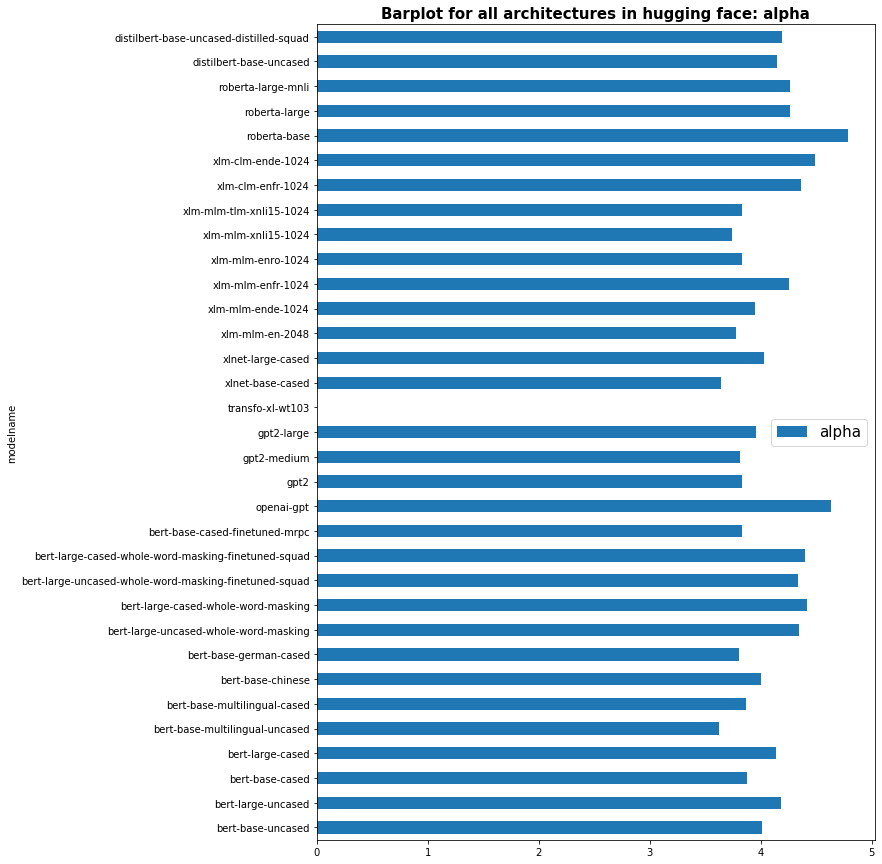

<Figure size 720x1080 with 0 Axes>

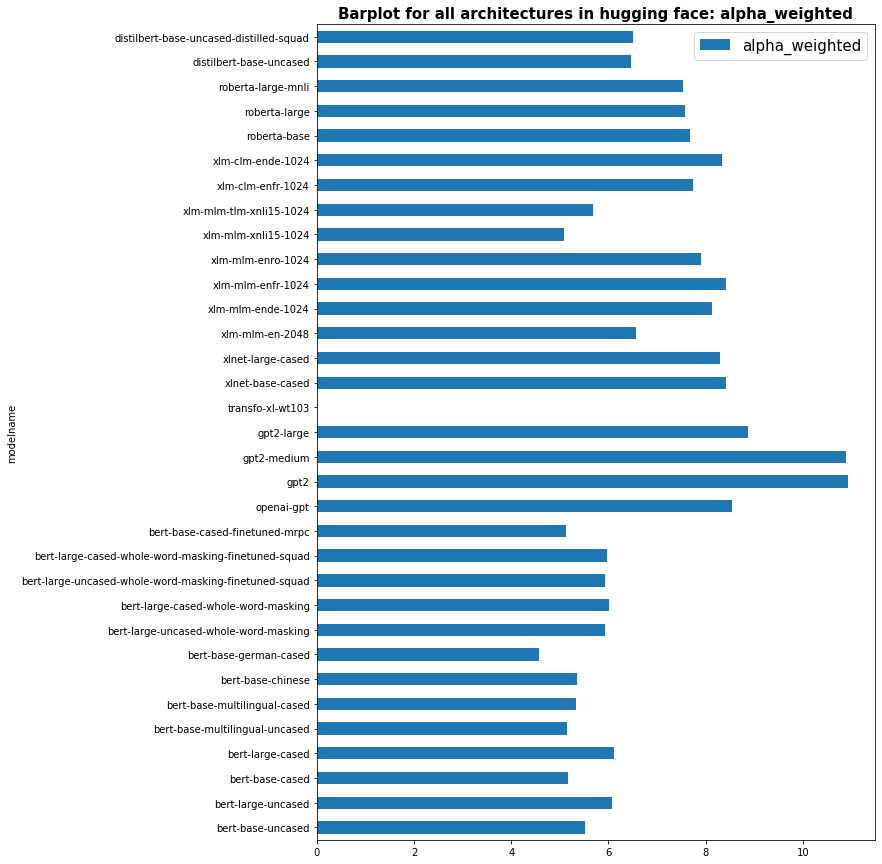

<Figure size 720x1080 with 0 Axes>

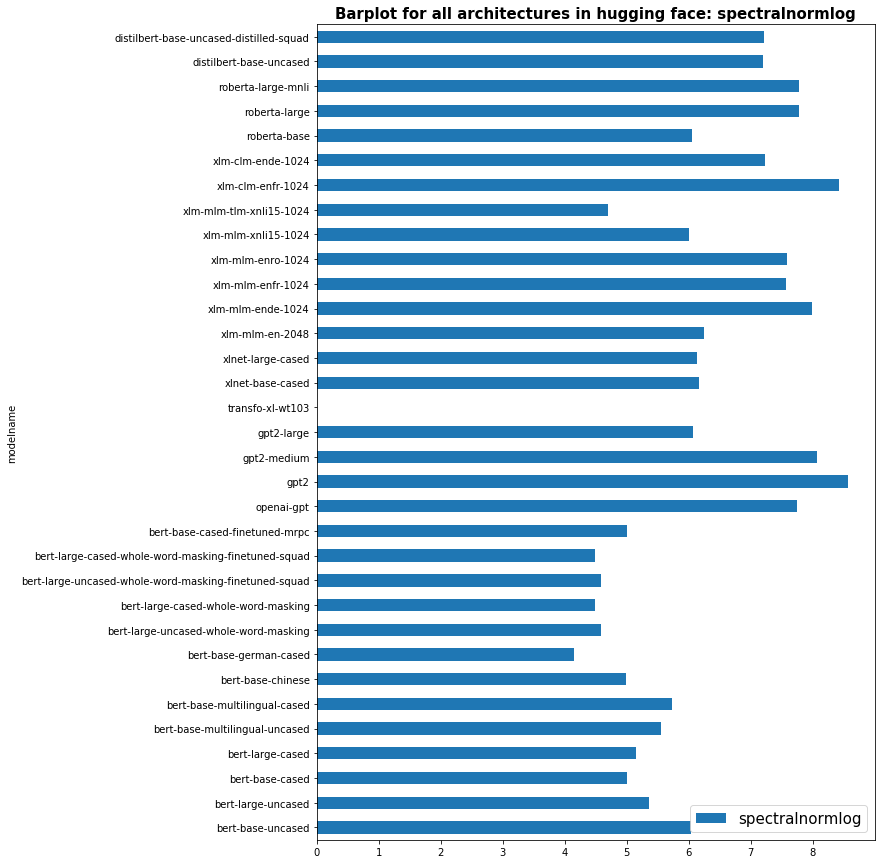

<Figure size 720x1080 with 0 Axes>

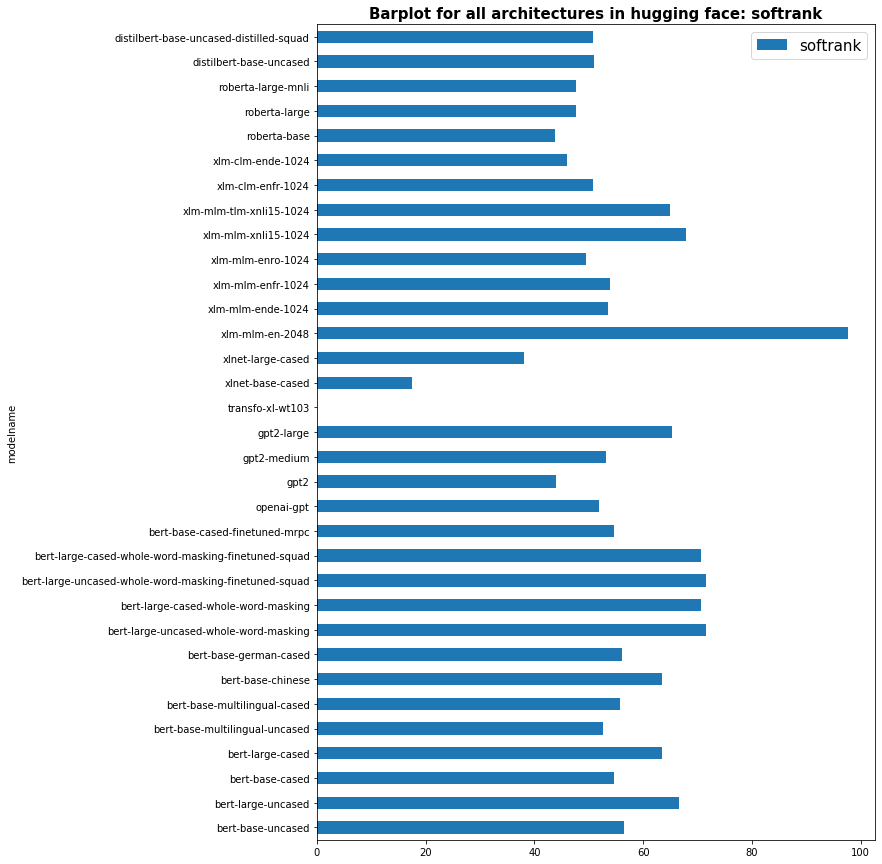

In [70]:
## Barplot for all archtectures
try:
    df_hugging
except:
    df_hugging = pd.read_excel(path + '/df_hugging.xlsx')\
                .rename(columns = {'Unnamed: 0': 'Architecture'})
    df_hugging['Architecture'] = df_hugging['Architecture'].fillna(method = 'ffill')

metrics = ['alpha', 'alpha_weighted', 'spectralnormlog', 'softrank']
df_hugging['spectralnormlog'] = np.log(df_hugging['spectralnorm'])

for m in metrics:
    plt.figure(figsize = (10,15))
    df_hugging.plot.barh(x = 'modelname', y = m, figsize = (10,15))
    plt.title('Barplot for all architectures in hugging face: {}'.format(m), fontweight = 'bold', fontsize = 15)
    plt.legend([m], fontsize = 15)


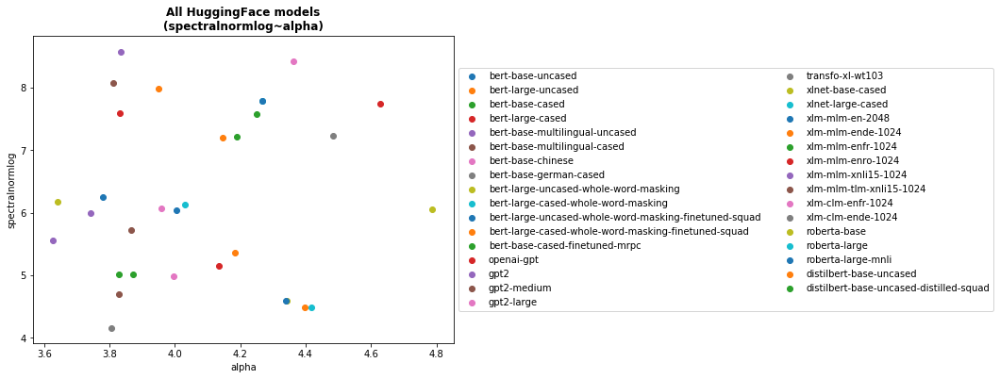

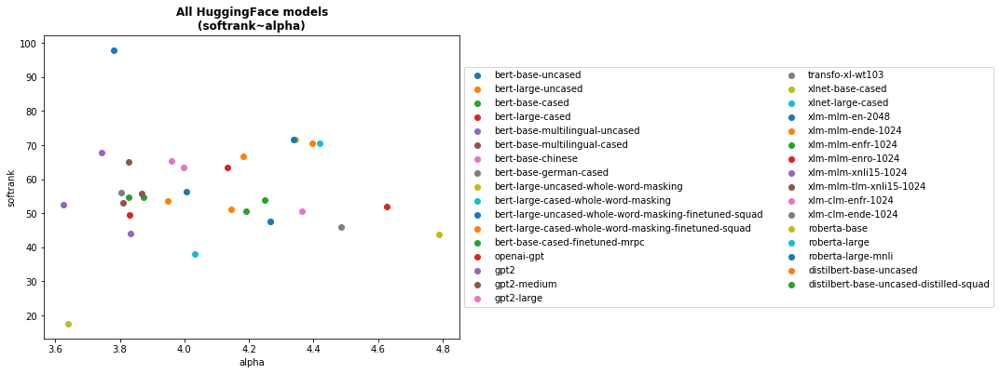

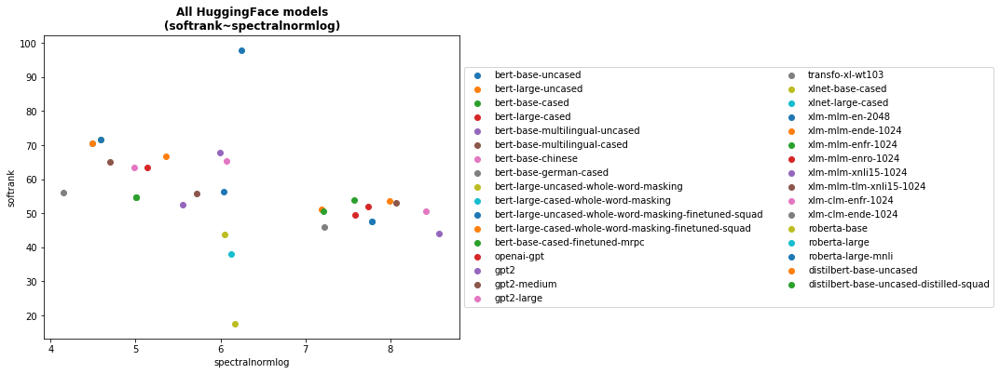

In [71]:
## Scatter plot for other metrics
temp = df_hugging.copy()

for x, y in itertools.combinations(metrics[:1] + metrics[2:],2):
    plt.figure(figsize = (8, 6))
    for i in range(len(df_hugging)):
        plt.scatter(temp.loc[i, x], temp.loc[i, y], label = temp.loc[i, 'modelname'])
    plt.xlabel(x)
    plt.ylabel(y)
    plt.title('All HuggingFace models\n({}~{})'.format(y, x), 
              fontweight = 'bold')  
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=2)  

    
del temp